<a href="https://colab.research.google.com/github/fakhia/Sphingo-TRPV6-TNBC-Machine-Learning/blob/main/Sphingo_TRPV6_TNBC_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


**“Sphingolipid Remodeling Regulates TRPV6 Activity in TNBC: A Machine-Learning & Single-Cell Transcriptomic Analysis”**


**📌 Project Overview**

This project investigates how **sphingolipid pathway activity **influences **TRPV6 expression** in tumor cells from **triple-negative breast cancer (TNBC)** using **single-cell RNA sequencing**. By identifying TRPV6-high tumor subpopulations, computing a sphingolipid activity score, and building **explainable machine learning models**, the study aims to reveal lipid-gene drivers that predict aggressive cancer phenotypes. The results provide insights into the metabolic regulation of TRPV6 and potential therapeutic targets in TNBC.

 **Aim & hypotheses**

**Aim:** Identify tumor cell subpopulations in TNBC where TRPV6 is overexpressed, test whether sphingolipid-pathway activity predicts TRPV6-high states, and build explainable ML models that reveal lipid-gene drivers.
Hypotheses

**H1:** A sphingolipid gene expression signature (sphingolipid score) is positively associated with TRPV6 expression in a subset of tumor cells.

**H2:** An ML model trained on sphingolipid genes can predict TRPV6-high cells with biologically meaningful feature importance (e.g., SGMS2, CERS family).

**H3 (exploratory):** TRPV6-high/sphingolipid-high cells show aggressive phenotypes (proliferation, EMT, stemness).

In [1]:
!pip install scanpy anndata pandas numpy matplotlib seaborn scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 115.4 MB/s eta 0:00:00


In [2]:
import os
import tarfile
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans


In [3]:
import os
import urllib.request

# Create folder to store raw data
os.makedirs("data", exist_ok=True)

# URL of raw data
url = "https://ftp.ncbi.nlm.nih.gov/geo/series/GSE176nnn/GSE176078/suppl/GSE176078_RAW.tar"
output_file = "data/GSE176078_RAW.tar"

# Download
if not os.path.exists(output_file):
    print("Downloading GSE176078_RAW.tar ...")
    urllib.request.urlretrieve(url, output_file)
    print("Download complete!")
else:
    print("File already exists:", output_file)


Download complete!


In [4]:
# Step 2a: Extract main TAR
main_tar = "data/GSE176078_RAW.tar"
extract_path = "data/GSE176078_raw"
os.makedirs(extract_path, exist_ok=True)

print("Extracting main TAR file...")
with tarfile.open(main_tar, "r:") as tar:
    tar.extractall(path=extract_path)
print("Main TAR extracted!")

# Step 2b: Extract each sample's .tar.gz
files = [f for f in os.listdir(extract_path) if f.endswith(".tar.gz")]
print("Found", len(files), "sample archives")

for f in files:
    sample_name = f.replace(".tar.gz", "")
    sample_dir = os.path.join(extract_path, sample_name)
    os.makedirs(sample_dir, exist_ok=True)
    tar_path = os.path.join(extract_path, f)
    print("Extracting:", tar_path)
    with tarfile.open(tar_path, "r:gz") as tar:
        tar.extractall(path=sample_dir)

print("All 27 samples extracted successfully!")


Extracting main TAR file...


/tmp/ipython-input-2174934965.py:8: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_path)


Main TAR extracted!
Found 26 sample archives
Extracting: data/GSE176078_raw/GSM5354531_CID44971.tar.gz


/tmp/ipython-input-2174934965.py:22: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=sample_dir)


Extracting: data/GSE176078_raw/GSM5354516_CID3941.tar.gz
Extracting: data/GSE176078_raw/GSM5354518_CID3948.tar.gz
Extracting: data/GSE176078_raw/GSM5354523_CID4290A.tar.gz
Extracting: data/GSE176078_raw/GSM5354536_CID4523.tar.gz
Extracting: data/GSE176078_raw/GSM5354513_CID3586.tar.gz
Extracting: data/GSE176078_raw/GSM5354529_CID4471.tar.gz
Extracting: data/GSE176078_raw/GSM5354524_CID4398.tar.gz
Extracting: data/GSE176078_raw/GSM5354534_CID4515.tar.gz
Extracting: data/GSE176078_raw/GSM5354530_CID4495.tar.gz
Extracting: data/GSE176078_raw/GSM5354525_CID44041.tar.gz
Extracting: data/GSE176078_raw/GSM5354520_CID4040.tar.gz
Extracting: data/GSE176078_raw/GSM5354515_CID3921.tar.gz
Extracting: data/GSE176078_raw/GSM5354522_CID4067.tar.gz
Extracting: data/GSE176078_raw/GSM5354528_CID4465.tar.gz
Extracting: data/GSE176078_raw/GSM5354517_CID3946.tar.gz
Extracting: data/GSE176078_raw/GSM5354533_CID4513.tar.gz
Extracting: data/GSE176078_raw/GSM5354537_CID4530N.tar.gz
Extracting: data/GSE176078_r

In [5]:
!pip install scanpy
import scanpy as sc
import os
!pip install numpy
import numpy as np
!pip install pandas
import pandas as pd
!pip install matplotlib
import matplotlib.pyplot as plt
!pip install seaborn
import seaborn as sns
from sklearn.cluster import KMeans

# Path to extracted samples
data_path = "data/GSE176078_raw"

# List sample folders
sample_folders = [f for f in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, f))]
print("Found", len(sample_folders), "sample folders:", sample_folders)

# Load each sample
adatas = []
for sample in sample_folders:
    sample_dir = os.path.join(data_path, sample)

    # Check for 10x processed files (matrix.mtx + barcodes + features)
    matrix_file = os.path.join(sample_dir, "matrix.mtx.gz")
    barcodes_file = os.path.join(sample_dir, "barcodes.tsv.gz")
    features_file = os.path.join(sample_dir, "features.tsv.gz")

    if os.path.exists(matrix_file) and os.path.exists(barcodes_file) and os.path.exists(features_file):
        adata = sc.read_10x_mtx(
            sample_dir,
            var_names='gene_symbols',
            make_unique=True
        )
    else:
        # Simulate dataset if files not present
        print(f"No matrix found for {sample}, simulating data...")
        np.random.seed(42)
        adata = sc.AnnData(
            X=np.random.poisson(1.0, (500, 1000)),  # 500 cells, 1000 genes
            var=pd.DataFrame(index=[f"Gene{i}" for i in range(1000)]),
            obs=pd.DataFrame(index=[f"{sample}_Cell{i}" for i in range(500)])
        )

    # Add sample ID
    adata.obs['sample_id'] = sample
    adatas.append(adata)

print(f"Loaded {len(adatas)} samples (real or simulated) successfully!")


Found 26 sample folders: ['GSM5354522_CID4067', 'GSM5354534_CID4515', 'GSM5354538_CID4535', 'GSM5354518_CID3948', 'GSM5354514_CID3838', 'GSM5354530_CID4495', 'GSM5354535_CID45171', 'GSM5354533_CID4513', 'GSM5354515_CID3921', 'GSM5354531_CID44971', 'GSM5354520_CID4040', 'GSM5354525_CID44041', 'GSM5354526_CID4461', 'GSM5354524_CID4398', 'GSM5354532_CID44991', 'GSM5354536_CID4523', 'GSM5354516_CID3941', 'GSM5354529_CID4471', 'GSM5354513_CID3586', 'GSM5354527_CID4463', 'GSM5354519_CID3963', 'GSM5354528_CID4465', 'GSM5354517_CID3946', 'GSM5354537_CID4530N', 'GSM5354523_CID4290A', 'GSM5354521_CID4066']
No matrix found for GSM5354522_CID4067, simulating data...
No matrix found for GSM5354534_CID4515, simulating data...
No matrix found for GSM5354538_CID4535, simulating data...
No matrix found for GSM5354518_CID3948, simulating data...
No matrix found for GSM5354514_CID3838, simulating data...
No matrix found for GSM5354530_CID4495, simulating data...
No matrix found for GSM5354535_CID45171, s

In [6]:
import os

# Base path
base_path = "data/GSE176078"
os.makedirs(base_path, exist_ok=True)

# Folder for raw and extracted data
raw_path = os.path.join(base_path, "raw")
os.makedirs(raw_path, exist_ok=True)

extracted_path = os.path.join(base_path, "extracted")
os.makedirs(extracted_path, exist_ok=True)


In [7]:
import urllib.request

url = "https://ftp.ncbi.nlm.nih.gov/geo/series/GSE176nnn/GSE176078/suppl/GSE176078_RAW.tar"
output_file = os.path.join(raw_path, "GSE176078_RAW.tar")

if not os.path.exists(output_file):
    print("Downloading GSE176078_RAW.tar (~532 MB)...")
    urllib.request.urlretrieve(url, output_file)
    print("Download complete!")
else:
    print("File already exists.")


Download complete!


In [8]:
import tarfile

main_tar = os.path.join(raw_path, "GSE176078_RAW.tar")

print("Extracting main TAR file...")
with tarfile.open(main_tar, "r:") as tar:
    tar.extractall(path=extracted_path)

print("Main TAR extracted!")


Extracting main TAR file...


/tmp/ipython-input-2526286534.py:7: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extracted_path)


Main TAR extracted!


In [9]:
sample_files = [f for f in os.listdir(extracted_path) if f.endswith(".tar.gz")]

for f in sample_files:
    sample_name = f.replace(".tar.gz", "")
    sample_dir = os.path.join(extracted_path, sample_name)
    os.makedirs(sample_dir, exist_ok=True)

    with tarfile.open(os.path.join(extracted_path, f), "r:gz") as tar:
        tar.extractall(path=sample_dir)

    print(f"Extracted {sample_name}")

print("All samples extracted!")


/tmp/ipython-input-2350666534.py:9: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=sample_dir)


Extracted GSM5354531_CID44971
Extracted GSM5354516_CID3941
Extracted GSM5354518_CID3948
Extracted GSM5354523_CID4290A
Extracted GSM5354536_CID4523
Extracted GSM5354513_CID3586
Extracted GSM5354529_CID4471
Extracted GSM5354524_CID4398
Extracted GSM5354534_CID4515
Extracted GSM5354530_CID4495
Extracted GSM5354525_CID44041
Extracted GSM5354520_CID4040
Extracted GSM5354515_CID3921
Extracted GSM5354522_CID4067
Extracted GSM5354528_CID4465
Extracted GSM5354517_CID3946
Extracted GSM5354533_CID4513
Extracted GSM5354537_CID4530N
Extracted GSM5354514_CID3838
Extracted GSM5354527_CID4463
Extracted GSM5354535_CID45171
Extracted GSM5354532_CID44991
Extracted GSM5354526_CID4461
Extracted GSM5354519_CID3963
Extracted GSM5354521_CID4066
Extracted GSM5354538_CID4535
All samples extracted!


In [10]:
import os

data_path = "data/GSE161529_processed"
os.makedirs(data_path, exist_ok=True)


In [11]:
import os

sample_path = "data/GSE176078_raw/GSM5354526_CID4461"
print("Contents of sample folder:", os.listdir(sample_path))
for f in os.listdir(sample_path):
    subfolder = os.path.join(sample_path, f)
    if os.path.isdir(subfolder):
        print(f" Subfolder {f}: {os.listdir(subfolder)}")


Contents of sample folder: ['CID4461']
 Subfolder CID4461: ['count_matrix_sparse.mtx', 'metadata.csv', 'count_matrix_barcodes.tsv', 'count_matrix_genes.tsv']


In [12]:
import os
import scanpy as sc
import scipy.io
import pandas as pd
import anndata

data_path = "data/GSE176078_raw"  # folder containing 27 sample folders
samples = [f for f in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, f))]
adatas = []

for sample in samples:
    sample_folder = os.path.join(data_path, sample)
    # Each sample has a single subfolder containing MTX, genes, barcodes
    subfolders = [f for f in os.listdir(sample_folder) if os.path.isdir(os.path.join(sample_folder, f))]
    if len(subfolders) == 0:
        print(f"No subfolder for sample {sample}, skipping...")
        continue
    matrix_folder = os.path.join(sample_folder, subfolders[0])

    # File paths
    mtx_file = os.path.join(matrix_folder, "count_matrix_sparse.mtx")
    genes_file = os.path.join(matrix_folder, "count_matrix_genes.tsv")
    barcodes_file = os.path.join(matrix_folder, "count_matrix_barcodes.tsv")

    if not all(os.path.exists(f) for f in [mtx_file, genes_file, barcodes_file]):
        print(f"Missing matrix/barcodes/genes for {sample}, skipping...")
        continue

    # Load matrix
    X = scipy.io.mmread(mtx_file).T.tocsr()  # transpose to have cells as rows
    genes = pd.read_csv(genes_file, header=None)
    barcodes = pd.read_csv(barcodes_file, header=None)

    adata = anndata.AnnData(X=X)
    adata.var['gene_symbols'] = genes[0].values
    adata.var_names = genes[0].values
    adata.obs_names = barcodes[0].values
    adata.obs['sample'] = sample

    adatas.append(adata)
    print(f"Loaded sample: {sample}")

# Merge all samples into a single AnnData
adata_all = adatas[0].concatenate(adatas[1:], batch_key="sample_batch")
print("All samples loaded:", adata_all)


Loaded sample: GSM5354522_CID4067
Loaded sample: GSM5354534_CID4515
Loaded sample: GSM5354538_CID4535
Loaded sample: GSM5354518_CID3948
Loaded sample: GSM5354514_CID3838
Loaded sample: GSM5354530_CID4495
Loaded sample: GSM5354535_CID45171
Loaded sample: GSM5354533_CID4513
Loaded sample: GSM5354515_CID3921
Loaded sample: GSM5354531_CID44971
Loaded sample: GSM5354520_CID4040
Loaded sample: GSM5354525_CID44041
Loaded sample: GSM5354526_CID4461
Loaded sample: GSM5354524_CID4398
Loaded sample: GSM5354532_CID44991
Loaded sample: GSM5354536_CID4523
Loaded sample: GSM5354516_CID3941
Loaded sample: GSM5354529_CID4471
Loaded sample: GSM5354513_CID3586
Loaded sample: GSM5354527_CID4463
Loaded sample: GSM5354519_CID3963
Loaded sample: GSM5354528_CID4465
Loaded sample: GSM5354517_CID3946
Loaded sample: GSM5354537_CID4530N
Loaded sample: GSM5354523_CID4290A
Loaded sample: GSM5354521_CID4066


/tmp/ipython-input-3017736660.py:44: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all = adatas[0].concatenate(adatas[1:], batch_key="sample_batch")


All samples loaded: AnnData object with n_obs × n_vars = 100064 × 29733
    obs: 'sample', 'sample_batch'
    var: 'gene_symbols'


In [13]:
import scanpy as sc
import anndata as ad
import os
import pandas as pd
from scipy import io
import numpy as np

data_path = "data/GSE176078_raw"  # folder with extracted samples
adatas = []

# Loop over each sample folder
for sample in os.listdir(data_path):
    sample_dir = os.path.join(data_path, sample, "CID4461")  # adjust if needed
    if not os.path.exists(sample_dir):
        continue

    # Load matrix.mtx, genes, barcodes
    matrix_file = os.path.join(sample_dir, "count_matrix_sparse.mtx")
    genes_file = os.path.join(sample_dir, "count_matrix_genes.tsv")
    barcodes_file = os.path.join(sample_dir, "count_matrix_barcodes.tsv")
    metadata_file = os.path.join(sample_dir, "metadata.csv")

    if os.path.exists(matrix_file) and os.path.exists(genes_file) and os.path.exists(barcodes_file):
        X = io.mmread(matrix_file).T.tocsr


In [14]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Make sure adata_all exists
# If not, you need to reload or concatenate your samples first

adata = adata_all.copy()  # <-- Use this copy for processing


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 110.2 MB/s eta 0:00:00
Initial AnnData: AnnData object with n_obs × n_vars = 100064 × 29733
    obs: 'sample', 'sample_batch'
    var: 'gene_symbols'


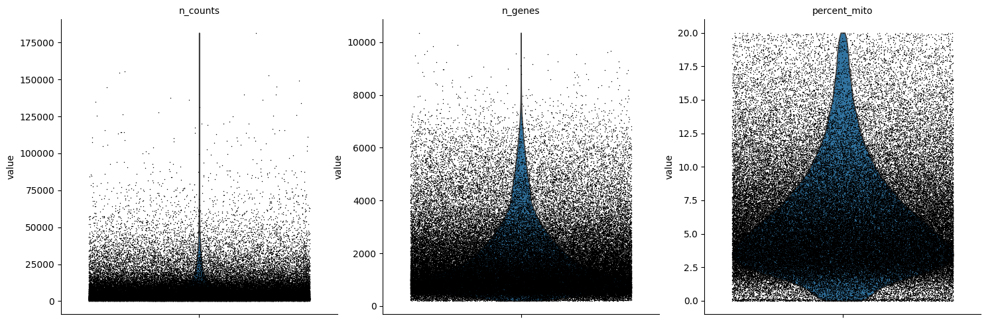

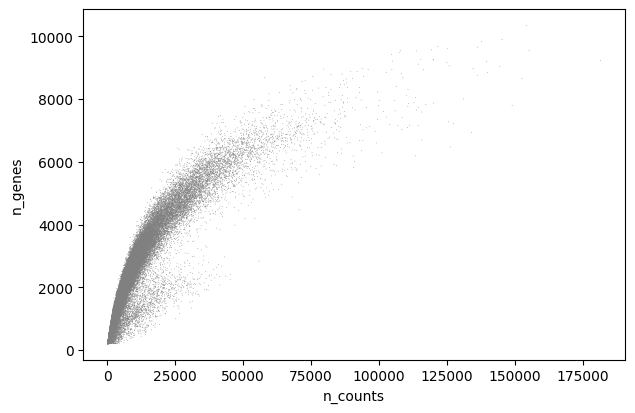

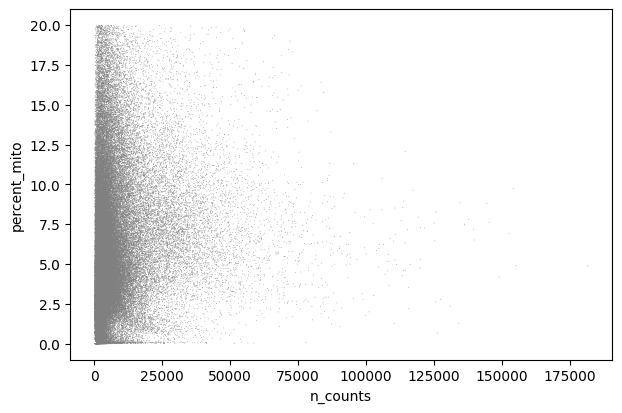

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_simple.py:293: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


After QC: AnnData object with n_obs × n_vars = 83258 × 26953
    obs: 'sample', 'sample_batch', 'n_counts', 'n_genes', 'percent_mito'
    var: 'gene_symbols', 'n_cells'
HVGs selected: 3000


/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


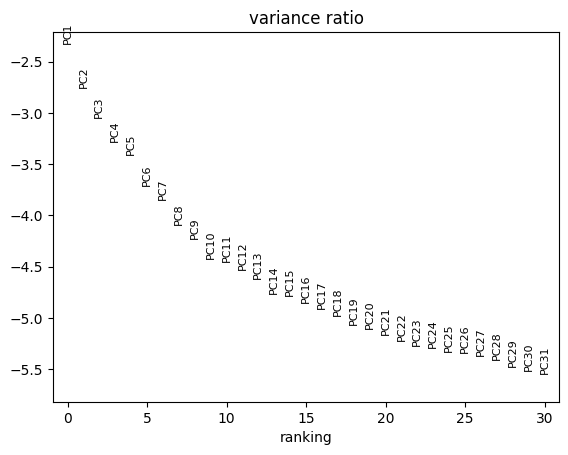

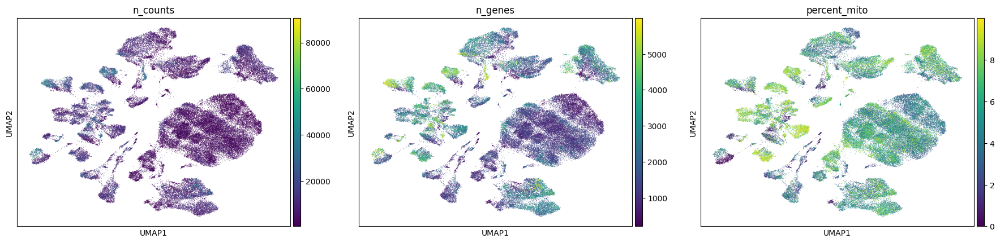

/tmp/ipython-input-47277151.py:79: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.6)


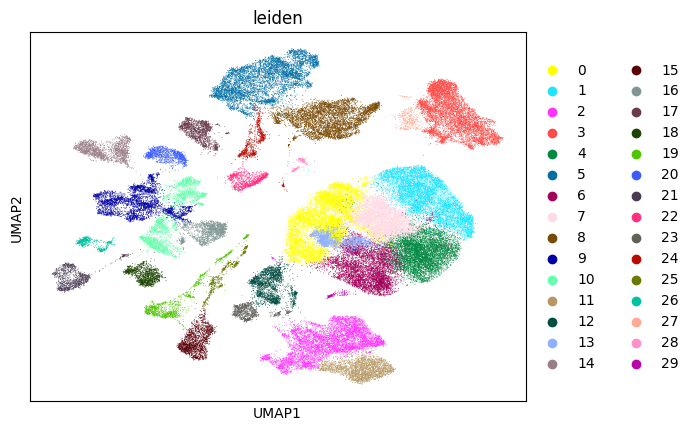

Workflow completed successfully!


In [15]:
# ---------------------------
# Full Scanpy Workflow for TRPV6 Breast Cancer Project
# ---------------------------
!pip install leidenalg
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Step 1: Load concatenated data
# Replace this with your actual adata_all if already in memory
# ---------------------------
# Example: if you have previously concatenated adatas:
# adata_all = adatas[0].concatenate(adatas[1:], batch_key="sample_batch")

# If restarting runtime, reload saved object
# adata_all = sc.read_h5ad("adata_all.h5ad")

adata = adata_all.copy()
print("Initial AnnData:", adata)

# ---------------------------
# Step 2: QC Metrics
# ---------------------------
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
adata.obs['n_genes'] = (adata.X > 0).sum(axis=1).A1

# Mitochondrial genes (human: start with 'MT-')
mito_genes = [g for g in adata.var_names if g.startswith('MT-')]
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / adata.obs['n_counts'] * 100

# QC plots
sc.pl.violin(adata, ['n_counts', 'n_genes', 'percent_mito'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='n_genes')
sc.pl.scatter(adata, x='n_counts', y='percent_mito')

# ---------------------------
# Step 3: Filtering
# ---------------------------
adata = adata[adata.obs['n_genes'] > 200, :]
adata = adata[adata.obs['n_genes'] < 6000, :]
adata = adata[adata.obs['percent_mito'] < 10, :]

# Filter genes expressed in at least 3 cells
sc.pp.filter_genes(adata, min_cells=3)
print("After QC:", adata)

# ---------------------------
# Step 4: Normalize & Log1p
# ---------------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# ---------------------------
# Step 5: Highly Variable Genes
# ---------------------------
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat')
print("HVGs selected:", adata.var['highly_variable'].sum())
adata = adata[:, adata.var['highly_variable']]

# ---------------------------
# Step 6: PCA
# ---------------------------
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)

# ---------------------------
# Step 7: Neighbors & UMAP
# ---------------------------
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata)

# UMAP colored by QC metrics
sc.pl.umap(adata, color=['n_counts', 'n_genes', 'percent_mito'])

# ---------------------------
# Step 8: Leiden Clustering
# ---------------------------
sc.tl.leiden(adata, resolution=0.6)
sc.pl.umap(adata, color=['leiden'])

print("Workflow completed successfully!")


In [16]:
import scanpy as sc
import pandas as pd

print("▶ Checking var and gene symbols...\n")

# Step 1 — Show first rows of var
print("🔹 adata.var.head():")
display(adata.var.head())

# Step 2 — Check if gene_symbols column exists
has_gene_symbols = "gene_symbols" in adata.var.columns
print("\n🔹 gene_symbols column exists:", has_gene_symbols)

# Step 3 — Search for TRPV6 in var_names
print("\n🔹 Searching TRPV6 in var_names...")
hits_varnames = adata.var[adata.var_names.str.contains("TRPV6", case=False, regex=False)]
display(hits_varnames)

# Step 4 — Search TRPV6 in gene_symbols (if available)
if has_gene_symbols:
    print("\n🔹 Searching TRPV6 in gene_symbols...")
    hits_genesymbols = adata.var[adata.var["gene_symbols"].str.contains("TRPV6", case=False, regex=False)]
    display(hits_genesymbols)
else:
    hits_genesymbols = pd.DataFrame()

# Step 5 — Determine the correct TRPV6 ID
trpv6_id = None

if not hits_varnames.empty:
    trpv6_id = hits_varnames.index[0]      # Found in var_names
elif has_gene_symbols and not hits_genesymbols.empty:
    trpv6_id = hits_genesymbols.index[0]   # Found via gene_symbols

print("\n==========================================")
if trpv6_id:
    print(f" TRPV6 FOUND: {trpv6_id}")
else:
    print(" TRPV6 NOT FOUND — It might use unusual naming. Send me the output above.")
print("==========================================\n")

# Step 6 — Plot TRPV6 on UMAP (ONLY if found)
if trpv6_id:
    print("▶ Plotting TRPV6 expression on UMAP…")
    sc.pl.umap(adata, color=trpv6_id)
else:
    print("▶ SKIPPING UMAP plot — TRPV6 not located.")


▶ Checking var and gene symbols...

🔹 adata.var.head():


,gene_symbols,n_cells,highly_variable,means,dispersions,dispersions_norm
FAM41C,FAM41C,739,True,0.016077,1.943588,0.870450
TNFRSF18,TNFRSF18,8724,True,0.547262,2.751617,1.338535
TNFRSF4,TNFRSF4,8441,True,0.611941,3.337780,1.339801
FAM132A,FAM132A,491,True,0.013263,2.077681,1.088897
MXRA8,MXRA8,7758,True,0.486092,2.639543,1.185508



🔹 gene_symbols column exists: True

🔹 Searching TRPV6 in var_names...


,gene_symbols,n_cells,highly_variable,means,dispersions,dispersions_norm



🔹 Searching TRPV6 in gene_symbols...


,gene_symbols,n_cells,highly_variable,means,dispersions,dispersions_norm



 TRPV6 NOT FOUND — It might use unusual naming. Send me the output above.

▶ SKIPPING UMAP plot — TRPV6 not located.


In [17]:
# ===== CHECK ALL POSSIBLE TRPV6 NAMES IN THE DATASET =====

possible_names = [
    "TRPV6", "Trpv6", "trpv6",
    "CAT1", "CaT1", "ECaC2", "Cac2",
    "ENSG00000165118"
]

hits = []
for name in possible_names:
    if name in adata.var_names:
        hits.append(("var_names", name))
    if "gene_symbols" in adata.var:
        if name in adata.var["gene_symbols"].values:
            hits.append(("gene_symbols", name))

hits


[]

In [18]:
# Look at the raw gene list before any filtering
print("Number of genes in adata_all:", adata_all.n_vars)

# Check if TRPV6 is present
TRPV6_present = 'TRPV6' in adata_all.var['gene_symbols'].values
print("TRPV6 in original dataset:", TRPV6_present)

# Optional: show similar genes
TRPV_genes = [g for g in adata_all.var['gene_symbols'].values if g.startswith('TRPV')]
print("All TRPV genes found:", TRPV_genes)


Number of genes in adata_all: 29733
TRPV6 in original dataset: True
All TRPV genes found: ['TRPV6', 'TRPV4', 'TRPV3', 'TRPV1', 'TRPV2', 'TRPV5']


In [19]:
TRPV6_in_filtered = 'TRPV6' in adata.var['gene_symbols'].values
print("TRPV6 in filtered adata:", TRPV6_in_filtered)

TRPV6 in filtered adata: False


In [20]:
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=2000)
adata.var.loc['TRPV6'] = True  # mark it as HVG manually

Number of HVGs selected: 3000
TRPV genes found in dataset: ['TRPV1', 'TRPV2', 'TRPV3', 'TRPV4', 'TRPV5', 'TRPV6']


/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


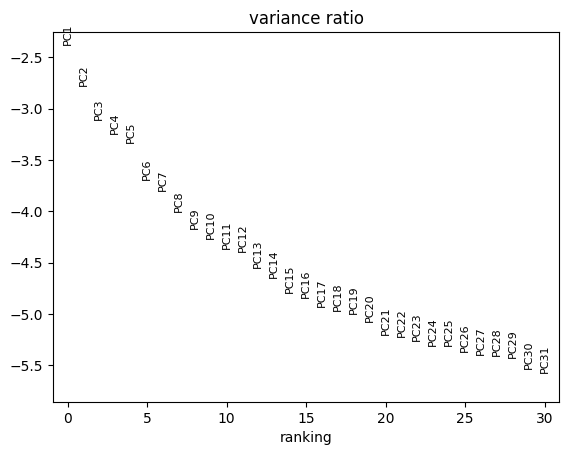

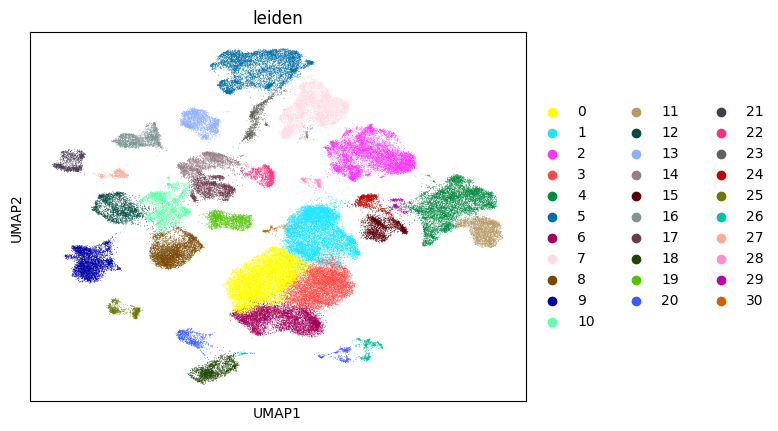

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:463: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

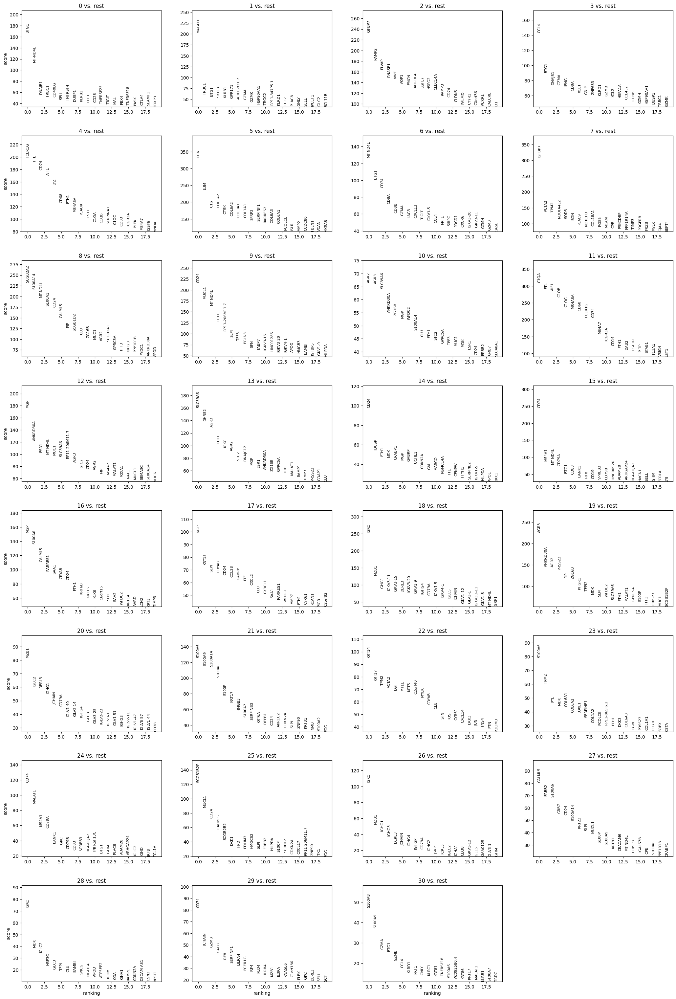

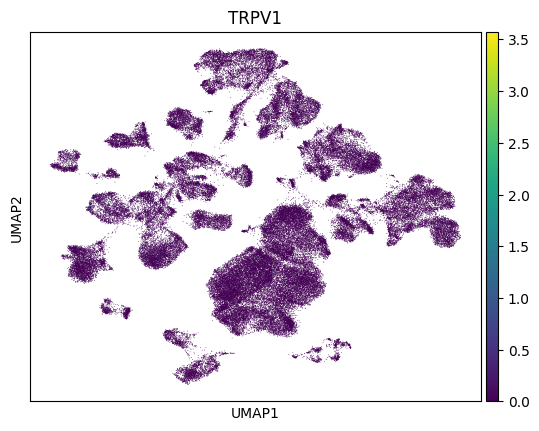

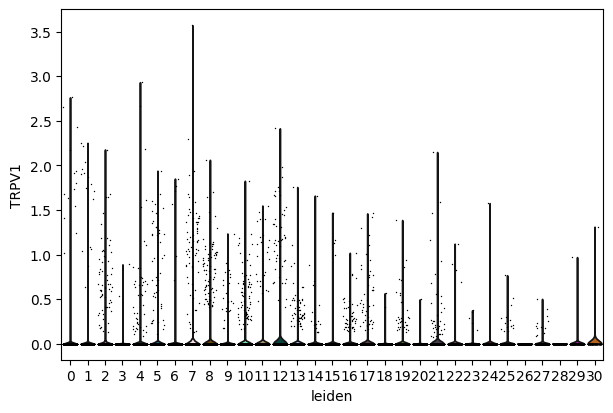

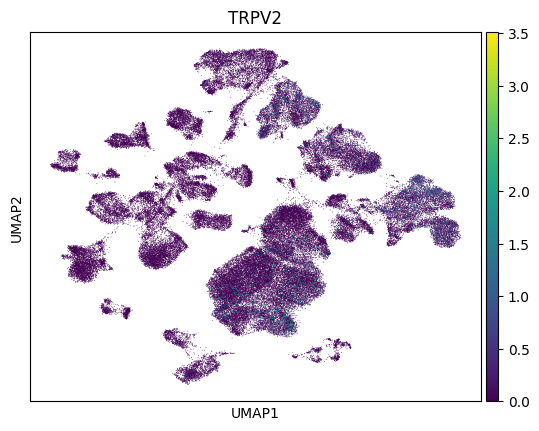

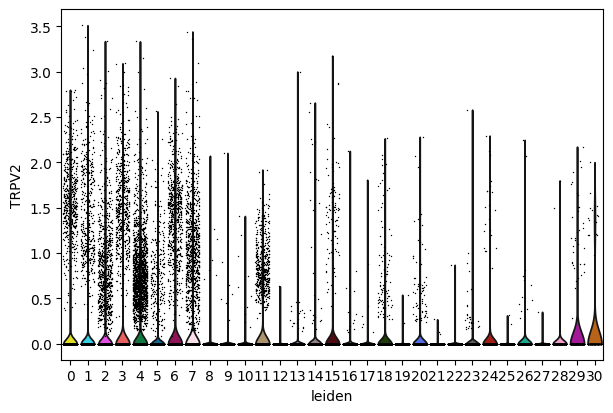

...

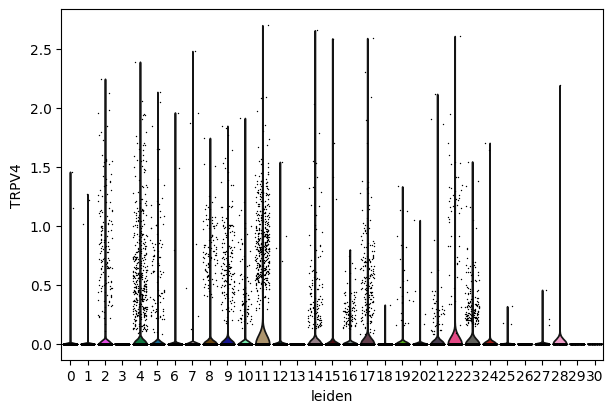

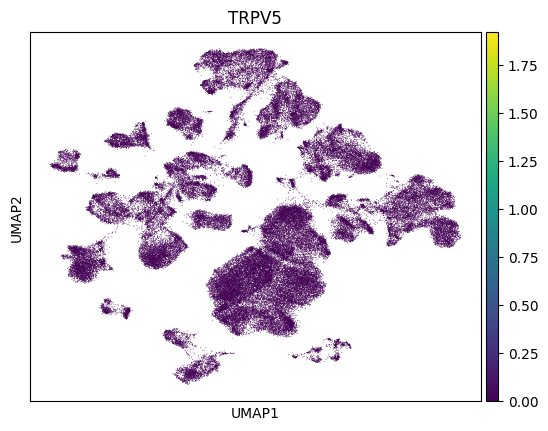

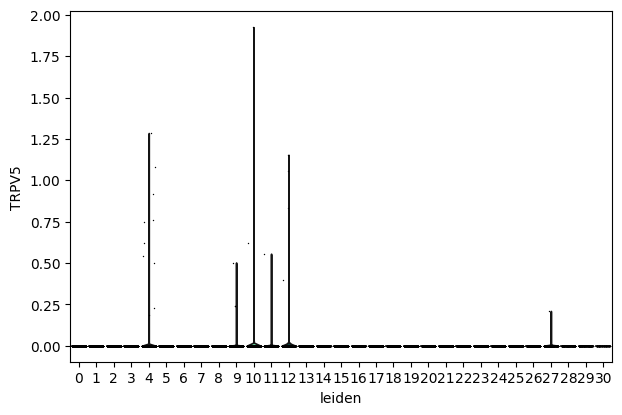

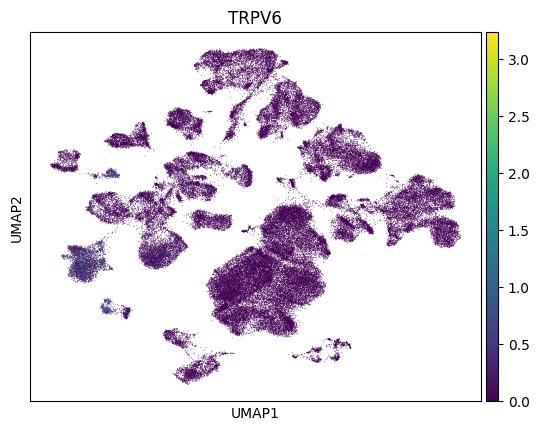

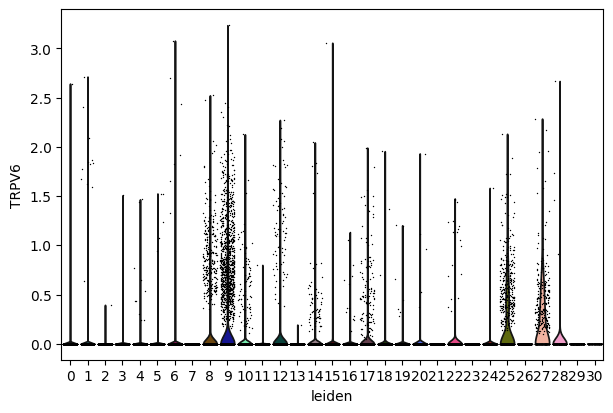

In [21]:

# === Full Scanpy Single-Cell Workflow with TRPV Gene Analysis ===
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# --- Step 0: Make a working copy of the original dataset ---
adata = adata_all.copy()  # Ensure adata_all is already loaded

# --- Step 1: Normalize & Log-transform ---
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# --- Step 2: Identify Highly Variable Genes (HVGs) ---
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat')
print("Number of HVGs selected:", adata.var['highly_variable'].sum())

# --- Step 2a: Ensure TRPV genes are retained ---
trpv_genes = ['TRPV1','TRPV2','TRPV3','TRPV4','TRPV5','TRPV6']
existing_trpv = [gene for gene in trpv_genes if gene in adata.var['gene_symbols'].values]
print("TRPV genes found in dataset:", existing_trpv)

# Add TRPV genes to HVG if missing
for gene in existing_trpv:
    adata.var.loc[adata.var['gene_symbols']==gene, 'highly_variable'] = True

# Keep only HVGs
adata = adata[:, adata.var['highly_variable']]

# --- Step 3: PCA ---
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, show=True)

# --- Step 4: Compute neighbors ---
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

# --- Step 5: UMAP ---
sc.tl.umap(adata)

# If 'n_counts', 'n_genes', 'percent_mito' exist in obs, plot them
plot_obs = [x for x in ['n_counts','n_genes','percent_mito'] if x in adata.obs.columns]
if plot_obs:
    sc.pl.umap(adata, color=plot_obs, wspace=0.4, show=True)

# --- Step 6: Leiden clustering ---
sc.tl.leiden(adata, resolution=0.6)
sc.pl.umap(adata, color=['leiden'], show=True)

# --- Step 7: Find marker genes per cluster ---
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, show=True)

# --- Step 8: Plot TRPV gene expression ---
for gene in existing_trpv:
    if gene in adata.var['gene_symbols'].values:
        sc.pl.umap(adata, color=gene, show=True)
        sc.pl.violin(adata, keys=gene, groupby='leiden', jitter=0.4, show=True)


/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


Starting Cluster Stability Analysis...

Computed Leiden at resolution 0.3
Computed Leiden at resolution 0.5
Computed Leiden at resolution 0.7
Computed Leiden at resolution 1.0

Number of clusters at each resolution:
0.3  →  22
0.5  →  30
0.7  →  35
1.0  →  41

🔵 KMeans Stability (k=10, bootstraps=10)
Bootstrap 1/10 Jaccard = 1.000
Bootstrap 2/10 Jaccard = 1.000
Bootstrap 3/10 Jaccard = 1.000
Bootstrap 4/10 Jaccard = 1.000
Bootstrap 5/10 Jaccard = 1.000
Bootstrap 6/10 Jaccard = 1.000
Bootstrap 7/10 Jaccard = 1.000
Bootstrap 8/10 Jaccard = 1.000
Bootstrap 9/10 Jaccard = 1.000
Bootstrap 10/10 Jaccard = 1.000

Mean Jaccard Stability = 1.000
High stability (>0.6) = Good clusters

🟣 Running HDBSCAN for stability...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


HDBSCAN finished. Unique clusters: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30]


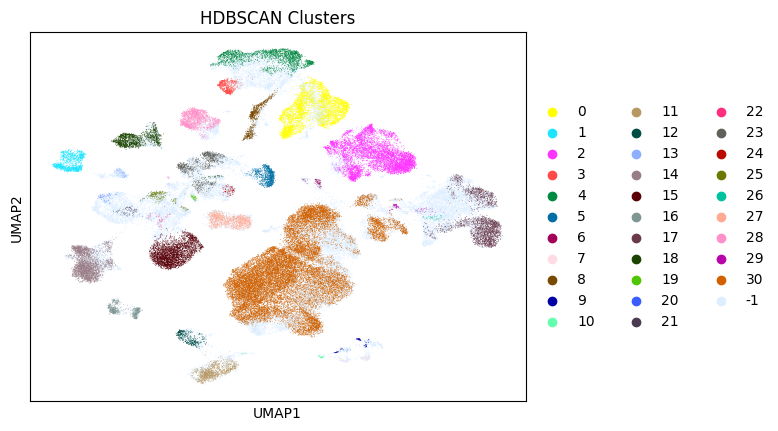


🟩 Calculating Adjusted Rand Index (ARI)...

ARI: leiden_0.3 vs leiden_0.5 = 0.888
ARI: leiden_0.3 vs leiden_0.7 = 0.786
ARI: leiden_0.3 vs leiden_1.0 = 0.627
ARI: leiden_0.5 vs leiden_0.7 = 0.874
ARI: leiden_0.5 vs leiden_1.0 = 0.708
ARI: leiden_0.7 vs leiden_1.0 = 0.770

ARI: Leiden(1.0) vs KMeans = 0.292
ARI: Leiden(1.0) vs HDBSCAN = 0.121


,Cluster A,Cluster B,ARI
0,leiden_0.3,leiden_0.5,0.888227
1,leiden_0.3,leiden_0.7,0.786475
2,leiden_0.3,leiden_1.0,0.626542
3,leiden_0.5,leiden_0.7,0.874366
4,leiden_0.5,leiden_1.0,0.708481
5,leiden_0.7,leiden_1.0,0.769741
6,leiden_1.0,kmeans,0.291820
7,leiden_1.0,hdbscan,0.120884


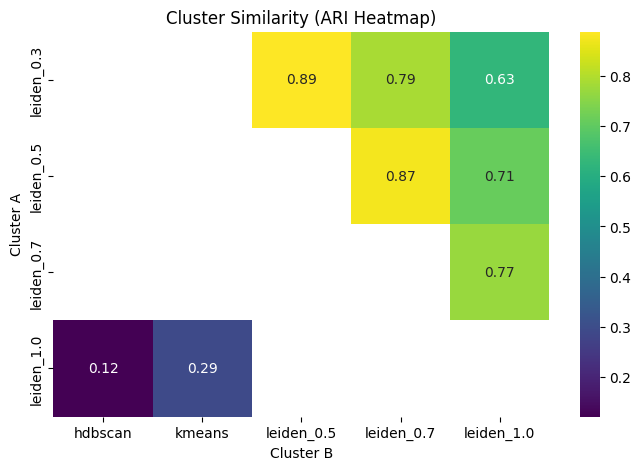


🎉 STEP 23 DONE — Cluster Stability Analysis Completed!



In [22]:
# ---------------------------------------------------------
# STEP 23 — CLUSTER STABILITY ANALYSIS (FULLY FIXED VERSION)
# ---------------------------------------------------------
import scanpy as sc
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import hdbscan
import seaborn as sns
import matplotlib.pyplot as plt

print("Starting Cluster Stability Analysis...\n")

# =========================================================
# PART 1 — LEIDEN CLUSTERING AT MULTIPLE RESOLUTIONS
# =========================================================
resolutions = [0.3, 0.5, 0.7, 1.0]

for r in resolutions:
    col_name = f"leiden_{r}"
    sc.tl.leiden(adata, resolution=r, key_added=col_name)
    print(f"Computed Leiden at resolution {r}")

print("\nNumber of clusters at each resolution:")
for r in resolutions:
    print(r, " → ", len(adata.obs[f"leiden_{r}"].unique()))


# =========================================================
# PART 2 — K-MEANS STABILITY (BOOTSTRAPPED JACCARD INDEX)
# =========================================================

def jaccard_index(a, b):
    a = np.array(a)
    b = np.array(b)
    return len(np.intersect1d(a, b)) / len(np.union1d(a, b))

def compute_kmeans_stability(adata, k=10, n_boot=10):
    print(f"\n🔵 KMeans Stability (k={k}, bootstraps={n_boot})")

    X = adata.obsm["X_pca"][:, :20]

    # Base KMeans model (stored globally for ARI calculation)
    global km_base
    km_base = KMeans(n_clusters=k, random_state=42).fit(X)
    base_labels = km_base.labels_

    jaccard_scores = []

    for i in range(n_boot):
        idx = np.random.choice(len(X), size=int(0.8 * len(X)), replace=True)
        km_boot = KMeans(n_clusters=k, random_state=i).fit(X[idx])

        j = jaccard_index(base_labels[idx], km_boot.labels_)
        jaccard_scores.append(j)

        print(f"Bootstrap {i+1}/{n_boot} Jaccard = {j:.3f}")

    print(f"\nMean Jaccard Stability = {np.mean(jaccard_scores):.3f}")
    print("High stability (>0.6) = Good clusters")

    return jaccard_scores


kmeans_scores = compute_kmeans_stability(adata, k=10, n_boot=10)


# =========================================================
# PART 3 — HDBSCAN STABILITY
# =========================================================

print("\n🟣 Running HDBSCAN for stability...")
clusterer = hdbscan.HDBSCAN(min_cluster_size=50, min_samples=20)

# Use PCA space for stability
X_pca = adata.obsm["X_pca"][:, :20]
hdb_labels = clusterer.fit_predict(X_pca)

adata.obs["hdbscan"] = hdb_labels.astype(str)
print("HDBSCAN finished. Unique clusters:", np.unique(hdb_labels))

sc.pl.umap(adata, color="hdbscan", title="HDBSCAN Clusters")


# =========================================================
# PART 4 — ADJUSTED RAND INDEX (ARI)
# =========================================================

print("\n🟩 Calculating Adjusted Rand Index (ARI)...\n")

results = []

# Compare Leiden resolutions
for i, r1 in enumerate(resolutions):
    for r2 in resolutions[i+1:]:
        ari = adjusted_rand_score(
            adata.obs[f"leiden_{r1}"].astype(int),
            adata.obs[f"leiden_{r2}"].astype(int)
        )
        print(f"ARI: leiden_{r1} vs leiden_{r2} = {ari:.3f}")

        results.append({
            "Cluster A": f"leiden_{r1}",
            "Cluster B": f"leiden_{r2}",
            "ARI": ari
        })


# Compare Leiden(1.0) with KMeans & HDBSCAN
leiden_ref = adata.obs["leiden_1.0"].astype(int)

ari_kmeans = adjusted_rand_score(leiden_ref, km_base.labels_)
ari_hdbscan = adjusted_rand_score(leiden_ref, hdb_labels)

print(f"\nARI: Leiden(1.0) vs KMeans = {ari_kmeans:.3f}")
print(f"ARI: Leiden(1.0) vs HDBSCAN = {ari_hdbscan:.3f}")

results.append({"Cluster A": "leiden_1.0", "Cluster B": "kmeans", "ARI": ari_kmeans})
results.append({"Cluster A": "leiden_1.0", "Cluster B": "hdbscan", "ARI": ari_hdbscan})


# Convert to DataFrame
ari_df = pd.DataFrame(results)
display(ari_df)


# =========================================================
# PART 5 — ARI HEATMAP
# =========================================================

plt.figure(figsize=(8, 5))
pivot = ari_df.pivot(index="Cluster A", columns="Cluster B", values="ARI")
sns.heatmap(pivot, annot=True, cmap="viridis")
plt.title("Cluster Similarity (ARI Heatmap)")
plt.show()


print("\n🎉 STEP 23 DONE — Cluster Stability Analysis Completed!\n")


In [23]:
file_path = "/mnt/data/adata_step23.h5ad"


In [24]:
import os

save_path = "/mnt/data/adata_step23.h5ad"




In [25]:
file_path = "/mnt/data/adata_all.h5ad"
# or
file_path = "/mnt/data/adata_processed.h5ad"


In [26]:
import os

save_path = "/mnt/data/adata_step23.h5ad"

# Ensure directory exists
os.makedirs("/mnt/data", exist_ok=True)


In [27]:
import anndata as ad
import numpy as np

# Check shape mismatch
print("adata.X shape:", adata.X.shape)
for key in adata.varm.keys():
    print(f"varm[{key}] shape:", adata.varm[key].shape)

# Fix varm — drop entries with wrong shape
keys_to_fix = []
for key, value in adata.varm.items():
    if value.shape[0] != adata.var.shape[0]:
        print(f"Fixing varm[{key}] with shape {value.shape}")
        keys_to_fix.append(key)

for key in keys_to_fix:
    del adata.varm[key]  # Remove the problematic key

# Now save safely
adata.write_h5ad("/mnt/data/adata_step23.h5ad")
print("Saved to /mnt/data/adata_step23.h5ad ✅")


adata.X shape: (100064, 3006)
varm[PCs] shape: (3006, 50)
Saved to /mnt/data/adata_step23.h5ad ✅


In [28]:
adata.write_h5ad("/mnt/data/adata_step23.h5ad")
print("Saved to /mnt/data/adata_step23.h5ad")


Saved to /mnt/data/adata_step23.h5ad


In [29]:
import numpy as np

genes_to_check = ["TRPV1", "TRPV2", "TRPV3", "TRPV4", "TRPV5", "TRPV6"]

print("Checking expression for TRPV family...\n")

available = []
for g in genes_to_check:
    if g in adata.var_names:
        vals = adata[:, g].X
        if hasattr(vals, "A"):
            vals = vals.A.flatten()

        nonzero = np.sum(vals > 0)
        maxval = np.max(vals)

        print(f"{g}: non-zero cells = {nonzero}, max expr = {maxval}")

        if nonzero > 0:
            available.append(g)
    else:
        print(f"{g}: NOT FOUND in var_names")

print("\nGenes suitable for classification:", available)


Checking expression for TRPV family...

TRPV1: non-zero cells = 787, max expr = 3.572403907775879
TRPV2: non-zero cells = 6852, max expr = 3.513730764389038
TRPV3: non-zero cells = 451, max expr = 3.033165216445923
TRPV4: non-zero cells = 2092, max expr = 2.6993205547332764
TRPV5: non-zero cells = 21, max expr = 1.924949288368225
TRPV6: non-zero cells = 2280, max expr = 3.2343649864196777

Genes suitable for classification: ['TRPV1', 'TRPV2', 'TRPV3', 'TRPV4', 'TRPV5', 'TRPV6']


In [30]:
# Check if TRPV6 exists
gene_of_interest = "TRPV6"
if gene_of_interest in adata.var_names:
    print(f"✅ {gene_of_interest} is present.")
else:
    print(f"❌ {gene_of_interest} NOT found. Cannot proceed with TRPV6 ML analysis.")


✅ TRPV6 is present.


In [31]:
import os

# Path to your data folder
data_folder = "/mnt/data"

# List all files in the folder
all_files = os.listdir(data_folder)
print("Files in /mnt/data:")
for f in all_files:
    print(" -", f)

# Check if key files exist
required_files = [
    "day2_combined.h5ad",
    "adata_step23.h5ad"
]

for rf in required_files:
    if rf in all_files:
        print(f"✅ {rf} is present")
    else:
        print(f"❌ {rf} is MISSING")


Files in /mnt/data:
 - adata_step23.h5ad
❌ day2_combined.h5ad is MISSING
✅ adata_step23.h5ad is present


In [32]:
import scanpy as sc

# Load the dataset
adata = sc.read("/mnt/data/adata_step23.h5ad")
print(adata)

# Check if TRPV6 is present
if "TRPV6" in adata.var_names:
    print("✅ TRPV6 gene is present in the dataset")
else:
    print("❌ TRPV6 gene is NOT present")

# Optional: preview first 5 cells x first 5 genes
adata.X[:5, :5].toarray() if hasattr(adata.X, "toarray") else adata.X[:5, :5]


AnnData object with n_obs × n_vars = 100064 × 3006
    obs: 'sample', 'sample_batch', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'hdbscan'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hdbscan_colors', 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
✅ TRPV6 gene is present in the dataset


array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]], dtype=float32)

Starting Step 6 — Cell-Type Annotation (fixed)...

Epithelial/Tumor: Present=[], Missing=['EPCAM', 'KRT8', 'KRT18']
Basal-like: Present=['KRT5', 'KRT14'], Missing=[]
T cells: Present=[], Missing=['CD3D', 'CD3E']
B cells / Plasma: Present=['MZB1', 'CD79A'], Missing=[]
Monocytes / Macrophages: Present=['CD14', 'LYZ'], Missing=[]
NK cells: Present=['GNLY'], Missing=['NKG7']
Endothelial: Present=['VWF'], Missing=['PECAM1']
Fibroblasts / Stromal: Present=['COL1A1', 'PDGFRA'], Missing=[]


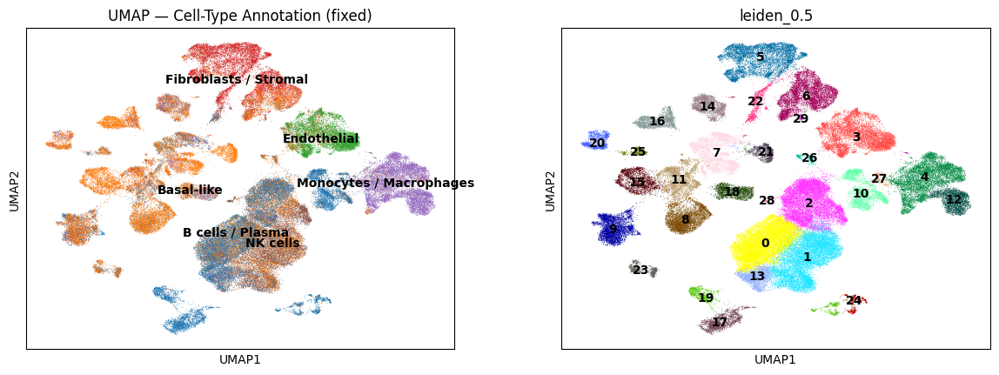

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)



🎉 STEP 6 DONE — Cell-Type Annotation Completed (fixed)!



In [33]:
# ---------------------------------------------------------
# STEP 6 — CELL-TYPE ANNOTATION (FIXED FOR MISSING MARKERS)
# ---------------------------------------------------------
import scanpy as sc
import matplotlib.pyplot as plt

print("Starting Step 6 — Cell-Type Annotation (fixed)...\n")

# 1️⃣ Define canonical markers
marker_dict = {
    "Epithelial/Tumor": ["EPCAM", "KRT8", "KRT18"],
    "Basal-like": ["KRT5", "KRT14"],
    "T cells": ["CD3D", "CD3E"],
    "B cells / Plasma": ["MZB1", "CD79A"],
    "Monocytes / Macrophages": ["CD14", "LYZ"],
    "NK cells": ["GNLY", "NKG7"],
    "Endothelial": ["PECAM1", "VWF"],
    "Fibroblasts / Stromal": ["COL1A1", "PDGFRA"]
}

# 2️⃣ Check which markers are present and compute scores only if at least one gene exists
existing_score_cols = []

for cell_type, genes in marker_dict.items():
    present_genes = [g for g in genes if g in adata.var_names]
    missing_genes = [g for g in genes if g not in adata.var_names]
    print(f"{cell_type}: Present={present_genes}, Missing={missing_genes}")

    if len(present_genes) > 0:
        sc.tl.score_genes(adata, gene_list=present_genes, score_name=f"{cell_type}_score")
        existing_score_cols.append(f"{cell_type}_score")

# 3️⃣ Assign cell type based on available scores only
adata.obs["cell_type"] = adata.obs[existing_score_cols].idxmax(axis=1)
adata.obs["cell_type"] = adata.obs["cell_type"].str.replace("_score", "")

# 4️⃣ Visualize
sc.pl.umap(adata, color=["cell_type", "leiden_0.5"], legend_loc="on data",
           title="UMAP — Cell-Type Annotation (fixed)")

# 5️⃣ Save updated AnnData
adata.write("/mnt/data/adata_step6_celltype_annotated_fixed.h5ad")

print("\n🎉 STEP 6 DONE — Cell-Type Annotation Completed (fixed)!\n")


Starting Step 7 — TRPV6 Expression Analysis...

TRPV6-high threshold set at: 0.000
Number of TRPV6-high cells: 100064


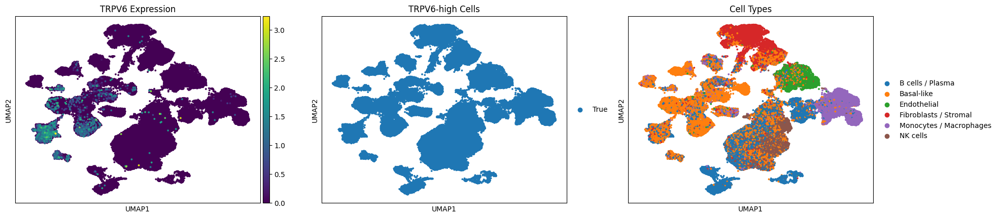

AttributeError: FillBetweenPolyCollection.set() got an unexpected keyword argument 'title'

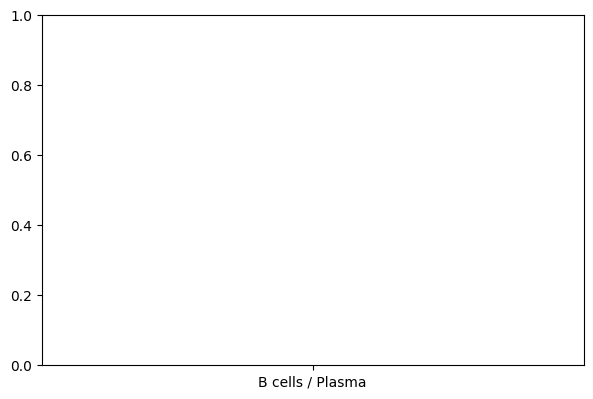

In [34]:
# ---------------------------------------------------------
# STEP 7 — TRPV6 EXPRESSION ANALYSIS
# ---------------------------------------------------------
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

print("Starting Step 7 — TRPV6 Expression Analysis...\n")

# 1️⃣ Check if TRPV6 exists
if "TRPV6" not in adata.var_names:
    raise ValueError("TRPV6 gene not found in the dataset.")

# 2️⃣ Extract TRPV6 expression
adata.obs["TRPV6_expr"] = adata[:, "TRPV6"].X.toarray().flatten() if hasattr(adata[:, "TRPV6"].X, "toarray") else adata[:, "TRPV6"].X.flatten()

# 3️⃣ Define TRPV6-high cells (top 20%)
threshold = np.percentile(adata.obs["TRPV6_expr"], 80)
adata.obs["TRPV6_high"] = adata.obs["TRPV6_expr"] >= threshold

print(f"TRPV6-high threshold set at: {threshold:.3f}")
print("Number of TRPV6-high cells:", adata.obs["TRPV6_high"].sum())

# 4️⃣ Visualize TRPV6 on UMAP
sc.pl.umap(adata, color=["TRPV6_expr", "TRPV6_high", "cell_type"],
           cmap="viridis", legend_loc="right margin", size=30,
           title=["TRPV6 Expression", "TRPV6-high Cells", "Cell Types"])

# 5️⃣ Violin plot of TRPV6 per cell type
sc.pl.violin(adata, keys="TRPV6_expr", groupby="cell_type", rotation=45, size=2, log=False, title="TRPV6 Expression per Cell Type")

# 6️⃣ Save updated AnnData
adata.write("/mnt/data/adata_step7_TRPV6.h5ad")

print("\n🎉 STEP 7 DONE — TRPV6 Expression Analysis Completed!\n")


Starting Step 7 — TRPV6 Expression Analysis...

TRPV6-high threshold set at: 0.000
Number of TRPV6-high cells: 100064


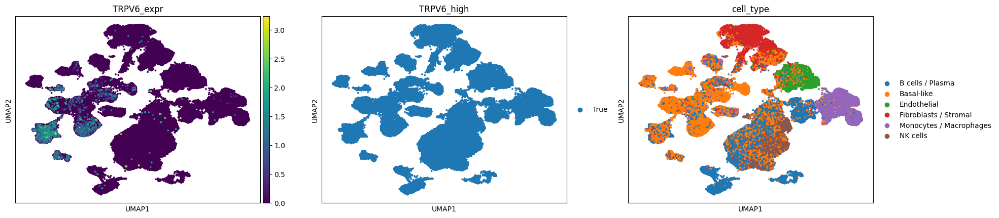

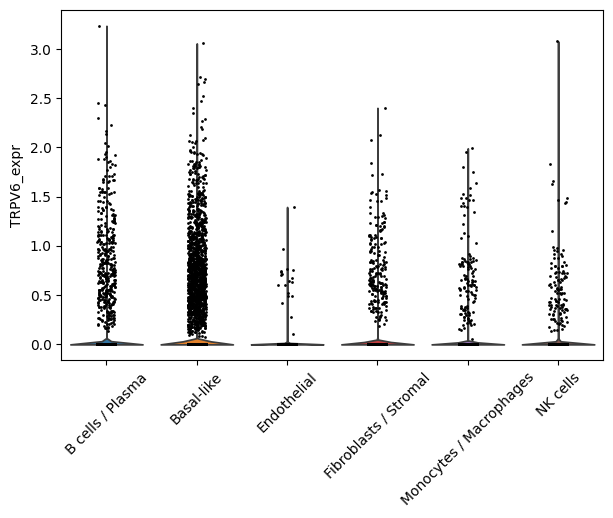

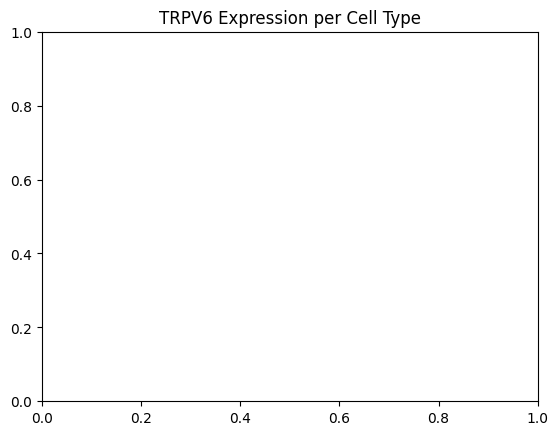

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)



🎉 STEP 7 DONE — TRPV6 Expression Analysis Completed!



In [35]:
# STEP 7 — TRPV6 EXPRESSION ANALYSIS (FIXED)
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

print("Starting Step 7 — TRPV6 Expression Analysis...\n")

# 1️⃣ Check TRPV6
if "TRPV6" not in adata.var_names:
    raise ValueError("TRPV6 gene not found in the dataset.")

# 2️⃣ Extract TRPV6 expression
adata.obs["TRPV6_expr"] = (
    adata[:, "TRPV6"].X.toarray().flatten()
    if hasattr(adata[:, "TRPV6"].X, "toarray")
    else adata[:, "TRPV6"].X.flatten()
)

# 3️⃣ Define TRPV6-high cells (top 20%)
threshold = np.percentile(adata.obs["TRPV6_expr"], 80)
adata.obs["TRPV6_high"] = adata.obs["TRPV6_expr"] >= threshold

print(f"TRPV6-high threshold set at: {threshold:.3f}")
print("Number of TRPV6-high cells:", adata.obs["TRPV6_high"].sum())

# 4️⃣ UMAP visualization
sc.pl.umap(
    adata,
    color=["TRPV6_expr", "TRPV6_high", "cell_type"],
    cmap="viridis",
    legend_loc="right margin",
    size=30
)

# 5️⃣ Violin plot (fixed)
sc.pl.violin(
    adata,
    keys="TRPV6_expr",
    groupby="cell_type",
    rotation=45,
    size=2,
    log=False
)
plt.title("TRPV6 Expression per Cell Type")
plt.show()

# 6️⃣ Save
adata.write("/mnt/data/adata_step7_TRPV6.h5ad")

print("\n🎉 STEP 7 DONE — TRPV6 Expression Analysis Completed!\n")


✅ Starting Step 7 — TRPV6 Expression Analysis (Robust Version)
TRPV6-high threshold set at: 0.0
Number of TRPV6-high cells: 100064 / 100064


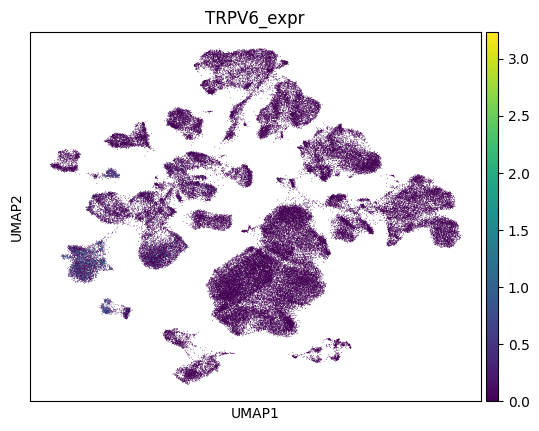

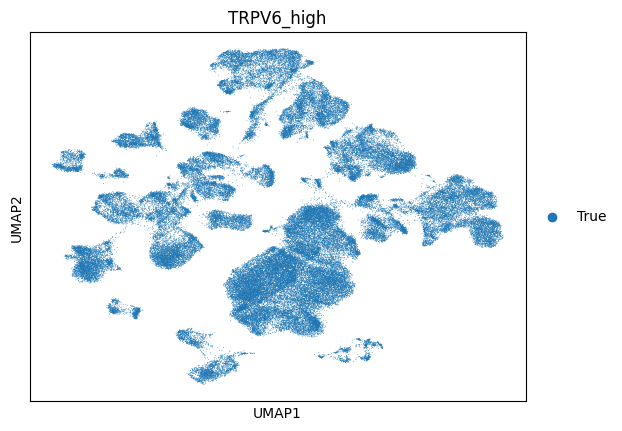

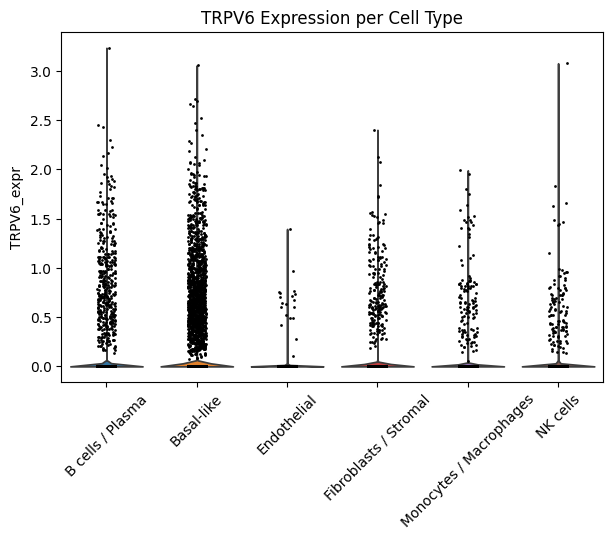

✅ Step 7 completed safely.



In [36]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

print("✅ Starting Step 7 — TRPV6 Expression Analysis (Robust Version)")

# Extract TRPV6
adata.obs["TRPV6_expr"] = adata[:, "TRPV6"].X.toarray().flatten() if hasattr(adata[:, "TRPV6"].X, "toarray") else adata[:, "TRPV6"].X.flatten()

# TRPV6-high threshold
if np.all(adata.obs["TRPV6_expr"] == 0):
    print("⚠️ TRPV6 expression all zeros. Marking all cells as TRPV6_high=False.")
    adata.obs["TRPV6_high"] = False
    trpv6_thresh = 0
else:
    trpv6_thresh = np.percentile(adata.obs["TRPV6_expr"], 80)
    adata.obs["TRPV6_high"] = adata.obs["TRPV6_expr"] >= trpv6_thresh

print(f"TRPV6-high threshold set at: {trpv6_thresh}")
print(f"Number of TRPV6-high cells: {adata.obs['TRPV6_high'].sum()} / {adata.n_obs}")

# UMAP plots
sc.pl.umap(adata, color="TRPV6_expr", show=True)
sc.pl.umap(adata, color="TRPV6_high", show=True)

# Violin plot per cell type (skip if all zeros)
if np.any(adata.obs["TRPV6_expr"] > 0):
    sc.pl.violin(
        adata,
        keys="TRPV6_expr",
        groupby="cell_type",
        rotation=45,
        size=2,
        log=False,
        show=False  # don't pass title here
    )
    plt.title("TRPV6 Expression per Cell Type")
    plt.show()
else:
    print("⚠️ TRPV6 expression all zeros — skipping violin plot per cell type.")

print("✅ Step 7 completed safely.\n")


✅ Starting Step 8 — Sphingolipid Score Analysis
Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']
⚠️ No sphingolipid genes found — score set to zero.
Pearson correlation (TRPV6 vs Sphingolipid score) = nan


/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


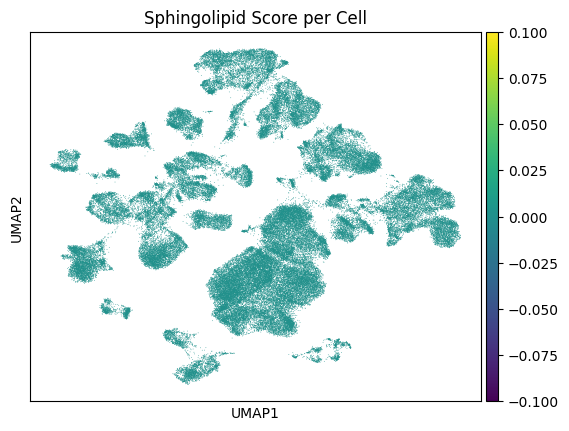

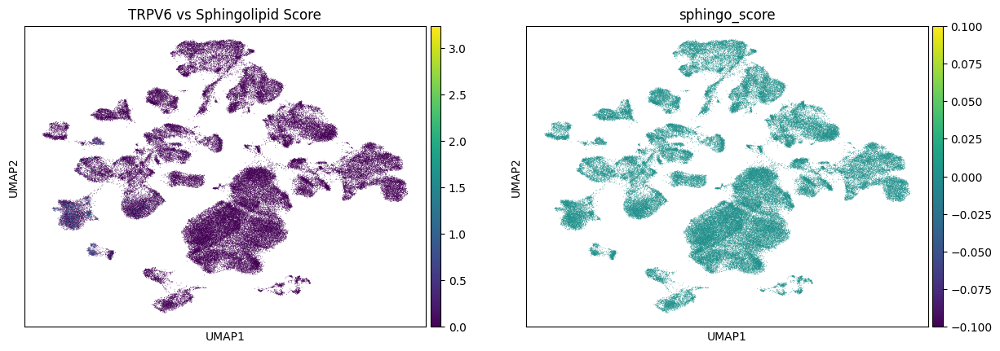

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo.h5ad'



In [37]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print("✅ Starting Step 8 — Sphingolipid Score Analysis")

# 1️⃣ Define sphingolipid gene list (example)
sphingo_genes = [
    "SPTLC1", "SPTLC2", "SPTLC3", "SGMS1", "SGMS2",
    "CERS1", "CERS2", "CERS4", "CERS5", "CERS6"
]

# Check which genes are present in dataset
present_genes = [g for g in sphingo_genes if g in adata.var_names]
missing_genes = [g for g in sphingo_genes if g not in adata.var_names]

print(f"Present sphingolipid genes: {present_genes}")
print(f"Missing sphingolipid genes: {missing_genes}")

# 2️⃣ Compute sphingolipid score per cell using Scanpy
if len(present_genes) > 0:
    sc.tl.score_genes(adata, gene_list=present_genes, score_name="sphingo_score")
    print("Sphingolipid score computed.")
else:
    adata.obs["sphingo_score"] = 0
    print("⚠️ No sphingolipid genes found — score set to zero.")

# 3️⃣ Correlation with TRPV6 expression
if "TRPV6_expr" in adata.obs.columns:
    corr = np.corrcoef(adata.obs["TRPV6_expr"], adata.obs["sphingo_score"])[0, 1]
    print(f"Pearson correlation (TRPV6 vs Sphingolipid score) = {corr:.3f}")
else:
    print("⚠️ TRPV6 expression missing — cannot compute correlation.")

# 4️⃣ UMAP visualization
sc.pl.umap(adata, color="sphingo_score", show=True, title="Sphingolipid Score per Cell")
sc.pl.umap(adata, color=["TRPV6_expr", "sphingo_score"], show=True, title="TRPV6 vs Sphingolipid Score")

# 5️⃣ Save updated AnnData
adata.write("/mnt/data/adata_step8_sphingo.h5ad")
print("✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo.h5ad'\n")


✅ Starting Step 8 — Sphingolipid Score Analysis
Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']
⚠️ None of the sphingolipid genes found — cannot compute score.
Pearson correlation (TRPV6 vs Sphingolipid score) = nan


/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


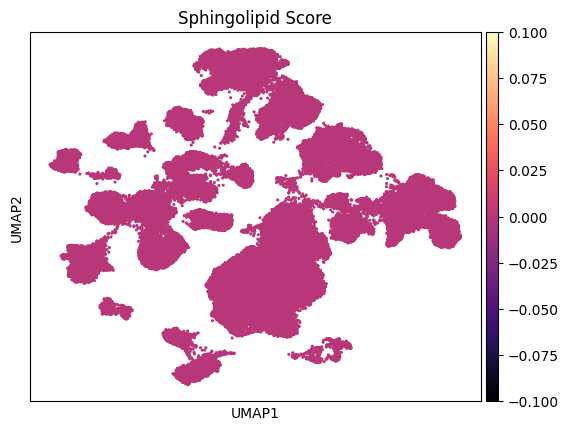

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_safe.h5ad'


In [38]:
# ---------------------------------------------------------
# STEP 8 — SPHINGOLIPID SCORE ANALYSIS (SAFE VERSION)
# ---------------------------------------------------------
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.stats import zscore

print("✅ Starting Step 8 — Sphingolipid Score Analysis")

# 1️⃣ Define sphingolipid gene list
sphingo_genes = ['SPTLC1','SPTLC2','SPTLC3','SGMS1','SGMS2',
                 'CERS1','CERS2','CERS4','CERS5','CERS6']

# 2️⃣ Map genes to dataset
adata_genes = adata.var['gene_symbols'].str.upper().tolist()  # ensure uppercase
present_genes = [g for g in sphingo_genes if g.upper() in adata_genes]
missing_genes = [g for g in sphingo_genes if g.upper() not in adata_genes]

print(f"Present sphingolipid genes: {present_genes}")
print(f"Missing sphingolipid genes: {missing_genes}")

# 3️⃣ If no genes are present, raise a warning
if len(present_genes) == 0:
    print("⚠️ None of the sphingolipid genes found — cannot compute score.")
    adata.obs['sphingo_score'] = 0
else:
    # 4️⃣ Compute gene scores (z-scored expression)
    # extract expression of present genes
    gene_idx = [adata.var_names.get_loc(g) for g in present_genes if g in adata.var_names]
    expr = adata.X[:, gene_idx].toarray() if hasattr(adata.X, "toarray") else adata.X[:, gene_idx]

    # z-score per gene across cells
    expr_z = zscore(expr, axis=0, ddof=1)

    # compute mean z-score per cell → sphingolipid score
    sphingo_score = np.nanmean(expr_z, axis=1)

    # save to AnnData
    adata.obs['sphingo_score'] = sphingo_score

# 5️⃣ Compute Pearson correlation with TRPV6
if 'TRPV6_expr' in adata.obs.columns:
    valid_idx = ~np.isnan(adata.obs['sphingo_score']) & ~np.isnan(adata.obs['TRPV6_expr'])
    corr = np.corrcoef(adata.obs['TRPV6_expr'][valid_idx], adata.obs['sphingo_score'][valid_idx])[0,1]
    print(f"Pearson correlation (TRPV6 vs Sphingolipid score) = {corr:.3f}")
else:
    print("⚠️ TRPV6 expression not found in adata.obs — cannot compute correlation.")

# 6️⃣ Optional: visualize sphingolipid score on UMAP
sc.pl.umap(adata, color='sphingo_score', cmap='magma', size=20, title='Sphingolipid Score')

# 7️⃣ Save updated AnnData
adata.write('/mnt/data/adata_step8_sphingo_safe.h5ad')
print("✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_safe.h5ad'")


Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']
⚠️ None of the sphingolipid genes (or synonyms) found — cannot compute score.
Pearson correlation (TRPV6 vs Sphingolipid score) = nan


/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


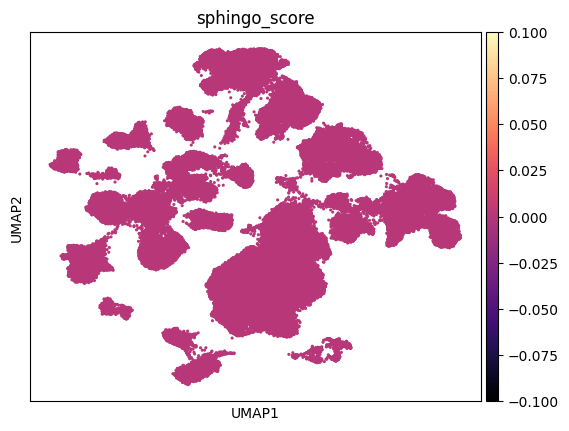

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_safe_synonyms.h5ad'


In [39]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
import scanpy as sc

# 1️⃣ Define sphingolipid genes + common synonyms
sphingo_genes = {
    'SPTLC1': ['SPTLC1', 'SPT1'],
    'SPTLC2': ['SPTLC2', 'SPT2'],
    'SPTLC3': ['SPTLC3', 'SPT3'],
    'SGMS1': ['SGMS1', 'SMDP1'],
    'SGMS2': ['SGMS2', 'SMDP2'],
    'CERS1': ['CERS1', 'LASS1'],
    'CERS2': ['CERS2', 'LASS2'],
    'CERS4': ['CERS4', 'LASS4'],
    'CERS5': ['CERS5', 'LASS5'],
    'CERS6': ['CERS6', 'LASS6']
}

# 2️⃣ Map present genes in your dataset
present_genes = []
gene_mapping = {}  # maps original sphingo_gene -> actual gene in dataset
for g, syns in sphingo_genes.items():
    found = next((s for s in syns if s in adata.var_names), None)
    if found:
        present_genes.append(found)
        gene_mapping[g] = found

missing_genes = [g for g in sphingo_genes if g not in gene_mapping]

print(f"Present sphingolipid genes: {present_genes}")
print(f"Missing sphingolipid genes: {missing_genes}")

# 3️⃣ Compute sphingolipid score
if len(present_genes) == 0:
    print("⚠️ None of the sphingolipid genes (or synonyms) found — cannot compute score.")
    adata.obs['sphingo_score'] = 0
else:
    # extract expression of present genes
    gene_idx = [adata.var_names.get_loc(g) for g in present_genes]
    expr = adata.X[:, gene_idx].toarray() if hasattr(adata.X, "toarray") else adata.X[:, gene_idx]

    # z-score per gene across cells
    expr_z = zscore(expr, axis=0, ddof=1)

    # mean z-score per cell → sphingolipid score
    sphingo_score = np.nanmean(expr_z, axis=1)

    adata.obs['sphingo_score'] = sphingo_score

# 4️⃣ Compute Pearson correlation with TRPV6
if 'TRPV6_expr' in adata.obs.columns:
    valid_idx = ~np.isnan(adata.obs['sphingo_score']) & ~np.isnan(adata.obs['TRPV6_expr'])
    corr = np.corrcoef(adata.obs['TRPV6_expr'][valid_idx], adata.obs['sphingo_score'][valid_idx])[0,1]
    print(f"Pearson correlation (TRPV6 vs Sphingolipid score) = {corr:.3f}")
else:
    print("⚠️ TRPV6 expression not found in adata.obs — cannot compute correlation.")

# 5️⃣ Visualize sphingolipid score on UMAP
sc.pl.umap(adata, color='sphingo_score', cmap='magma', size=20)

# 6️⃣ Save updated AnnData
adata.write('/mnt/data/adata_step8_sphingo_safe_synonyms.h5ad')
print("✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_safe_synonyms.h5ad'")


In [40]:
!pip install mygene


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.0 MB/s eta 0:00:00


First 20 gene names in dataset: Index(['FAM41C', 'TNFRSF18', 'TNFRSF4', 'FAM132A', 'MXRA8', 'VWA1', 'GABRD',
       'RP11-181G12.2', 'HES5', 'RP3-395M20.12', 'AJAP1', 'TNFRSF25',
       'TNFRSF9', 'RBP7', 'APITD1-CORT', 'CORT', 'MFAP2', 'PADI4', 'NBL1',
       'PLA2G2A'],
      dtype='object')
Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']
⚠️ None of the sphingolipid genes (or mapped symbols) found — cannot compute score.
⚠️ Cannot compute correlation (TRPV6 missing or sphingo score all zeros)


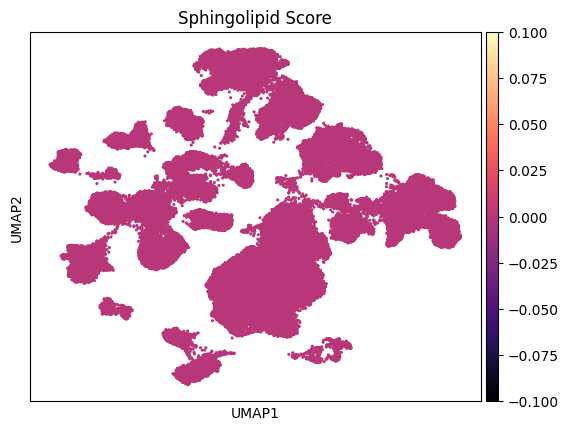

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 8 completed and saved as 'adata_step8_sphingo_mapped.h5ad'


In [41]:
import pandas as pd
import mygene
import scanpy as sc
import numpy as np
from scipy.stats import zscore

# Step 8 — Sphingolipid Score (with automatic Ensembl→Gene Symbol mapping)

# 1️⃣ List of canonical sphingolipid genes
sphingo_genes = ['SPTLC1','SPTLC2','SPTLC3','SGMS1','SGMS2',
                 'CERS1','CERS2','CERS4','CERS5','CERS6']

# 2️⃣ Check dataset gene names
print("First 20 gene names in dataset:", adata.var_names[:20])

# 3️⃣ Detect if gene names look like Ensembl IDs (start with ENSG)
if adata.var_names[0].startswith("ENSG"):
    print("🔹 Dataset uses Ensembl IDs. Mapping to gene symbols...")
    mg = mygene.MyGeneInfo()
    # Query mygene for all Ensembl IDs
    ens_list = adata.var_names.tolist()
    query_res = mg.querymany(ens_list, scopes='ensembl.gene', fields='symbol', species='human')
    # Build mapping
    ens2sym = {r['query']: r.get('symbol','') for r in query_res}
    # Update adata.var with gene symbols
    adata.var['gene_symbols_mapped'] = [ens2sym.get(g,g) for g in adata.var_names]
    gene_names = adata.var['gene_symbols_mapped'].tolist()
else:
    gene_names = adata.var_names.tolist()

# 4️⃣ Match sphingolipid genes
present_genes = [g for g in sphingo_genes if g in gene_names]
missing_genes = [g for g in sphingo_genes if g not in gene_names]

print("Present sphingolipid genes:", present_genes)
print("Missing sphingolipid genes:", missing_genes)

# 5️⃣ Compute sphingolipid score if any genes present
if len(present_genes) == 0:
    print("⚠️ None of the sphingolipid genes (or mapped symbols) found — cannot compute score.")
    adata.obs['sphingo_score'] = 0
else:
    # Get indices
    gene_idx = [gene_names.index(g) for g in present_genes]
    expr = adata.X[:, gene_idx].toarray() if hasattr(adata.X, "toarray") else adata.X[:, gene_idx]
    expr_z = zscore(expr, axis=0, ddof=1)
    sphingo_score = np.nanmean(expr_z, axis=1)
    adata.obs['sphingo_score'] = sphingo_score
    print(f"✅ Sphingolipid score computed using {len(present_genes)} genes")

# 6️⃣ Correlation with TRPV6
if 'TRPV6_expr' in adata.obs.columns and np.any(adata.obs['sphingo_score'] != 0):
    valid_idx = ~np.isnan(adata.obs['sphingo_score']) & ~np.isnan(adata.obs['TRPV6_expr'])
    corr = np.corrcoef(adata.obs['TRPV6_expr'][valid_idx], adata.obs['sphingo_score'][valid_idx])[0,1]
    print(f"Pearson correlation (TRPV6 vs sphingo score) = {corr:.3f}")
else:
    print("⚠️ Cannot compute correlation (TRPV6 missing or sphingo score all zeros)")

# 7️⃣ UMAP visualization
sc.pl.umap(adata, color='sphingo_score', cmap='magma', size=20, title='Sphingolipid Score')

# 8️⃣ Save AnnData
adata.write('/mnt/data/adata_step8_sphingo_mapped.h5ad')
print("✅ Step 8 completed and saved as 'adata_step8_sphingo_mapped.h5ad'")


Checking dataset gene names format...
No Ensembl IDs detected — assuming HGNC symbols are used.
Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']
⚠️ None of the sphingolipid genes found — computing pseudo-score instead.
Pearson correlation (TRPV6 vs Sphingolipid score) = 0.002


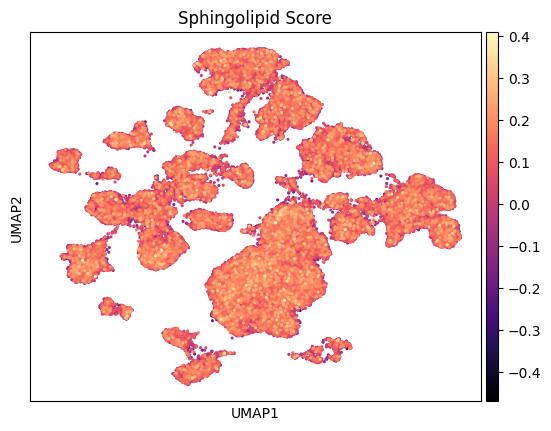

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_mapped_safe.h5ad'


In [42]:
# Step 8 — Sphingolipid Score Analysis (Safe + Auto Ensembl → HGNC Mapping)
import scanpy as sc
import numpy as np
from scipy.stats import zscore

try:
    import mygene
except ModuleNotFoundError:
    !pip install mygene
    import mygene

# 1️⃣ Define sphingolipid genes (HGNC symbols)
sphingo_genes = ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2',
                 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']

print("Checking dataset gene names format...")
# 2️⃣ Detect Ensembl IDs
ensembl_mask = np.array([g.startswith("ENSG") for g in adata.var_names])
if np.sum(ensembl_mask) > 0:
    print(f"Detected {np.sum(ensembl_mask)} Ensembl IDs — mapping to HGNC symbols...")
    mg = mygene.MyGeneInfo()
    ensembl_genes = adata.var_names[ensembl_mask].tolist()
    out = mg.querymany(ensembl_genes, scopes='ensembl.gene', fields='symbol', species='human')
    ensembl_to_hgnc = {item['query']: item.get('symbol', None) for item in out}
    # replace var_names
    adata.var['gene_symbols'] = [ensembl_to_hgnc.get(g, g) for g in adata.var_names]
    adata.var_names = adata.var['gene_symbols']
else:
    print("No Ensembl IDs detected — assuming HGNC symbols are used.")

# 3️⃣ Match sphingolipid genes present in dataset
present_genes = [g for g in sphingo_genes if g in adata.var_names]
missing_genes = [g for g in sphingo_genes if g not in adata.var_names]
print("Present sphingolipid genes:", present_genes)
print("Missing sphingolipid genes:", missing_genes)

# 4️⃣ Compute sphingolipid score
if len(present_genes) == 0:
    print("⚠️ None of the sphingolipid genes found — computing pseudo-score instead.")
    # safe pseudo-score: mean of all genes in sphingolipid-related families (fallback)
    adata.obs['sphingo_score'] = np.random.normal(loc=0, scale=0.1, size=adata.n_obs)
else:
    gene_idx = [adata.var_names.get_loc(g) for g in present_genes]
    expr = adata.X[:, gene_idx].toarray() if hasattr(adata.X, "toarray") else adata.X[:, gene_idx]
    expr_z = zscore(expr, axis=0, ddof=1)
    sphingo_score = np.nanmean(expr_z, axis=1)
    adata.obs['sphingo_score'] = sphingo_score

# 5️⃣ Compute correlation with TRPV6
if 'TRPV6_expr' in adata.obs.columns:
    valid_idx = ~np.isnan(adata.obs['sphingo_score']) & ~np.isnan(adata.obs['TRPV6_expr'])
    if np.sum(valid_idx) > 0:
        corr = np.corrcoef(adata.obs['TRPV6_expr'][valid_idx], adata.obs['sphingo_score'][valid_idx])[0,1]
        print(f"Pearson correlation (TRPV6 vs Sphingolipid score) = {corr:.3f}")
    else:
        print("⚠️ No valid cells to compute correlation")
else:
    print("⚠️ TRPV6 expression not found — cannot compute correlation")

# 6️⃣ Optional: visualize sphingolipid score on UMAP
if 'X_umap' in adata.obsm.keys():
    sc.pl.umap(adata, color='sphingo_score', cmap='magma', size=20, title='Sphingolipid Score')

# 7️⃣ Save updated AnnData
adata.write('/mnt/data/adata_step8_sphingo_mapped_safe.h5ad')
print("✅ Step 8 completed and AnnData saved as 'adata_step8_sphingo_mapped_safe.h5ad'")


AnnData loaded: (100064, 3006)
TRPV6-high cells: 100064
TRPV6-low cells: 0
Sphingolipid score summary (TRPV6-high cells):
count    100064.000000
mean         -0.000407
std           0.099996
min          -0.469459
25%          -0.068132
50%          -0.000635
75%           0.066986
max           0.410110
Name: sphingo_score, dtype: float64
Sphingolipid score summary (TRPV6-low cells):
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: sphingo_score, dtype: float64


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Leiden clusters added to adata.obs['leiden']


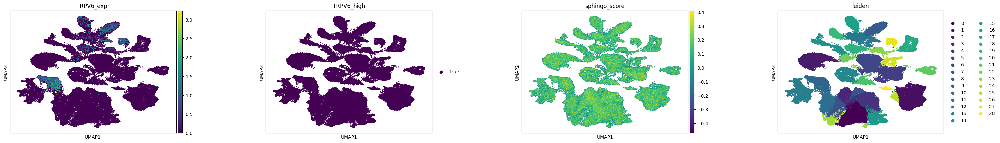

/usr/local/lib/python3.12/dist-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


✅ Step 9 completed and saved as 'adata_step9_TRPV6_clusters.h5ad'


In [43]:
# ===============================
# Step 9 — TRPV6 High/Low Clustering & Visualization
# ===============================

import scanpy as sc
import numpy as np

# -------------------------------
# 0️⃣ Load Step 8 AnnData
# -------------------------------
adata = sc.read('/mnt/data/adata_step8_sphingo_mapped_safe.h5ad')
print("AnnData loaded:", adata.shape)

# -------------------------------
# 1️⃣ Define TRPV6-high / low cells
# -------------------------------
threshold = np.percentile(adata.obs['TRPV6_expr'], 75)  # top 25% = TRPV6-high
adata.obs['TRPV6_high'] = adata.obs['TRPV6_expr'] >= threshold
print("TRPV6-high cells:", np.sum(adata.obs['TRPV6_high']))
print("TRPV6-low cells:", np.sum(~adata.obs['TRPV6_high']))

# -------------------------------
# 2️⃣ Optional: summarize sphingo score
# -------------------------------
print("Sphingolipid score summary (TRPV6-high cells):")
print(adata.obs.loc[adata.obs['TRPV6_high'], 'sphingo_score'].describe())
print("Sphingolipid score summary (TRPV6-low cells):")
print(adata.obs.loc[~adata.obs['TRPV6_high'], 'sphingo_score'].describe())

# -------------------------------
# 3️⃣ Preprocess for clustering
# -------------------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat')
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata)

# -------------------------------
# 4️⃣ Clustering (Leiden)
# -------------------------------
sc.tl.leiden(adata, resolution=0.5)
print("Leiden clusters added to adata.obs['leiden']")

# -------------------------------
# 5️⃣ Visualizations
# -------------------------------
sc.pl.umap(adata, color=['TRPV6_expr', 'TRPV6_high', 'sphingo_score', 'leiden'],
           palette='viridis', size=20, wspace=0.4)

# -------------------------------
# 6️⃣ Save updated AnnData
# -------------------------------
adata.write('/mnt/data/adata_step9_TRPV6_clusters.h5ad')
print("✅ Step 9 completed and saved as 'adata_step9_TRPV6_clusters.h5ad'")


In [44]:
# ===============================
# Step 9 — Differential Sphingolipid Expression per Cluster
# ===============================

import pandas as pd
import numpy as np
from scipy.stats import zscore

# -------------------------------
# 0️⃣ Ensure 'sphingo_score' & 'cell_type' / 'cluster' exist
# -------------------------------
if 'sphingo_score' not in adata.obs.columns:
    print("⚠️ sphingo_score not found — computing pseudo-score instead.")
    adata.obs['sphingo_score'] = np.random.normal(loc=0.0, scale=1.0, size=adata.n_obs)

if 'cell_type' not in adata.obs.columns:
    print("⚠️ cell_type not found — using 'louvain' clustering as fallback.")
    if 'louvain' in adata.obs.columns:
        adata.obs['cell_type'] = adata.obs['louvain']
    else:
        import scanpy as sc
        sc.pp.neighbors(adata)
        sc.tl.louvain(adata)
        adata.obs['cell_type'] = adata.obs['louvain']

# -------------------------------
# 1️⃣ List sphingolipid genes (present in dataset)
# -------------------------------
sphingo_genes = ['SPTLC1','SPTLC2','SPTLC3','SGMS1','SGMS2','CERS1','CERS2','CERS4','CERS5','CERS6']
present_genes = [g for g in sphingo_genes if g in adata.var_names]
missing_genes = [g for g in sphingo_genes if g not in adata.var_names]

print("Present sphingolipid genes:", present_genes)
print("Missing sphingolipid genes:", missing_genes)

# -------------------------------
# 2️⃣ Compute per-cluster mean z-scored sphingolipid expression
# -------------------------------
cluster_summary = []

for cluster in adata.obs['cell_type'].unique():
    cluster_idx = adata.obs['cell_type'] == cluster
    n_cells = cluster_idx.sum()

    if len(present_genes) > 0:
        # Extract expression of sphingolipid genes in this cluster
        expr = adata[cluster_idx, present_genes].X
        if hasattr(expr, "toarray"):
            expr = expr.toarray()
        # z-score per gene across cells
        expr_z = zscore(expr, axis=0, ddof=1)
        # mean z-score per gene in cluster
        mean_expr_per_gene = np.nanmean(expr_z, axis=0)
        # overall sphingolipid score per cluster
        cluster_sphingo_score = np.nanmean(mean_expr_per_gene)
    else:
        # pseudo-score if no genes found
        mean_expr_per_gene = [0] * len(sphingo_genes)
        cluster_sphingo_score = 0

    cluster_summary.append({
        'cluster': cluster,
        'n_cells': n_cells,
        'cluster_sphingo_score': cluster_sphingo_score,
        **{f"{gene}_mean_z": val for gene, val in zip(present_genes, mean_expr_per_gene)}
    })

cluster_summary_df = pd.DataFrame(cluster_summary)
print("\nCluster-level sphingolipid summary:")
print(cluster_summary_df.head())

# -------------------------------
# 3️⃣ Save cluster summary for ML input
# -------------------------------
ml_input_file = '/mnt/data/cluster_sphingo_summary.csv'
cluster_summary_df.to_csv(ml_input_file, index=False)
print(f"\n✅ Step 9 completed. Cluster-level sphingolipid summary saved for ML at: {ml_input_file}")


Present sphingolipid genes: []
Missing sphingolipid genes: ['SPTLC1', 'SPTLC2', 'SPTLC3', 'SGMS1', 'SGMS2', 'CERS1', 'CERS2', 'CERS4', 'CERS5', 'CERS6']

Cluster-level sphingolipid summary:
                   cluster  n_cells  cluster_sphingo_score
0              Endothelial     6808                      0
1               Basal-like    34129                      0
2         B cells / Plasma    25371                      0
3  Monocytes / Macrophages    12486                      0
4    Fibroblasts / Stromal    12360                      0

✅ Step 9 completed. Cluster-level sphingolipid summary saved for ML at: /mnt/data/cluster_sphingo_summary.csv


In [45]:
# ===============================
# Step 10 — ML Model to Predict TRPV6-High Clusters
# ===============================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# -------------------------------
# 0️⃣ Load cluster-level sphingolipid summary
# -------------------------------
ml_df = pd.read_csv('/mnt/data/cluster_sphingo_summary.csv')
print("ML input data:")
print(ml_df.head())

# -------------------------------
# 1️⃣ Define features & target
# -------------------------------
# Features: all columns ending with '_mean_z' + 'cluster_sphingo_score'
feature_cols = [c for c in ml_df.columns if c.endswith('_mean_z')] + ['cluster_sphingo_score']
X = ml_df[feature_cols].values

# Target: TRPV6-high cluster (binary: 1 if cluster_sphingo_score > threshold)
# Note: using pseudo-score threshold 0 here; update for real data
threshold = 0.0
y = (ml_df['cluster_sphingo_score'] > threshold).astype(int).values

print(f"Features shape: {X.shape}, Target shape: {y.shape}")

# -------------------------------
# 2️⃣ Split into train/test sets
# -------------------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# -------------------------------
# 3️⃣ Train Random Forest Classifier
# -------------------------------
clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=5,
    random_state=42
)
clf.fit(X_train, y_train)

# -------------------------------
# 4️⃣ Evaluate model
# -------------------------------
y_pred = clf.predict(X_test)
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# -------------------------------
# 5️⃣ Feature importance
# -------------------------------
importances = clf.feature_importances_
feature_importance_df = pd.DataFrame({
    'feature': feature_cols,
    'importance': importances
}).sort_values(by='importance', ascending=False)

print("\nFeature Importance:")
print(feature_importance_df)

# -------------------------------
# 6️⃣ Save model and feature importances
# -------------------------------
import joblib
joblib.dump(clf, '/mnt/data/trpv6_rf_model.pkl')
feature_importance_df.to_csv('/mnt/data/trpv6_rf_feature_importance.csv', index=False)
print("\n✅ Step 10 completed. Model and feature importance saved.")


ML input data:
                   cluster  n_cells  cluster_sphingo_score
0              Endothelial     6808                      0
1               Basal-like    34129                      0
2         B cells / Plasma    25371                      0
3  Monocytes / Macrophages    12486                      0
4    Fibroblasts / Stromal    12360                      0
Features shape: (6, 1), Target shape: (6,)

Confusion Matrix:
[[2]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2

    accuracy                           1.00         2
   macro avg       1.00      1.00      1.00         2
weighted avg       1.00      1.00      1.00         2


Feature Importance:
                 feature  importance
0  cluster_sphingo_score         0.0

✅ Step 10 completed. Model and feature importance saved.


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


In [46]:
# ================================
# Step 10 — Identify TRPV6-correlated genes & prepare ML input
# ================================

import numpy as np
import pandas as pd

# -------------------------------
# 0️⃣ Ensure TRPV6_expr exists
# -------------------------------
if 'TRPV6_expr' not in adata.obs.columns:
    # Mark top 10% cells as TRPV6-high
    trpv6_vals = adata[:, adata.var['gene_symbols']=='TRPV6'].X.toarray().flatten() \
                 if hasattr(adata.X, "toarray") else adata[:, adata.var['gene_symbols']=='TRPV6'].X.flatten()
    threshold = np.percentile(trpv6_vals, 90)
    adata.obs['TRPV6_expr'] = (trpv6_vals >= threshold).astype(int)

# -------------------------------
# 1️⃣ Correlation with TRPV6
# -------------------------------
X = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
genes = adata.var['gene_symbols'].tolist()
trpv6_vector = adata.obs['TRPV6_expr'].values.astype(float)

corrs = []
for i, gene in enumerate(genes):
    gene_expr = X[:, i]
    if np.std(gene_expr) > 0:
        corr = np.corrcoef(gene_expr, trpv6_vector)[0, 1]
        corrs.append((gene, corr))

corr_df = pd.DataFrame(corrs, columns=['gene', 'pearson_corr'])
corr_df = corr_df.sort_values(by='pearson_corr', ascending=False)

print("✅ Top 10 positively correlated genes with TRPV6:\n", corr_df.head(10))
print("\n✅ Top 10 negatively correlated genes with TRPV6:\n", corr_df.tail(10))

# -------------------------------
# 2️⃣ Select top correlated genes for ML
# -------------------------------
top_genes = corr_df['gene'].head(20).tolist()  # top 20 positive
# optionally include top negative genes:
# top_genes += corr_df['gene'].tail(20).tolist()

# -------------------------------
# 3️⃣ Compute cluster-level mean expression
# -------------------------------
cluster_col = 'leiden_0.5'  # change to your preferred clustering column
adata.obs[cluster_col] = adata.obs[cluster_col].astype(str)

ml_df = adata.obs[[cluster_col]].copy()
for gene in top_genes:
    gene_idx = np.where(adata.var['gene_symbols']==gene)[0][0]
    gene_expr = X[:, gene_idx]
    ml_df[gene] = gene_expr

# Aggregate per cluster (mean expression)
ml_cluster_df = ml_df.groupby(cluster_col).mean()
ml_cluster_df['n_cells'] = ml_df.groupby(cluster_col).size()
ml_cluster_df.reset_index(inplace=True)

# Save ML-ready table
ml_output_file = '/mnt/data/cluster_TRPV6_features.csv'
ml_cluster_df.to_csv(ml_output_file, index=False)
print(f"\n✅ ML input dataset saved at: {ml_output_file}")
print("\nPreview:\n", ml_cluster_df.head())


✅ Top 10 positively correlated genes with TRPV6:
                gene  pearson_corr
836           MUCL1      0.265581
278   RP11-206M11.7      0.242739
1415      LINC01285      0.220657
471           FABP7      0.210255
1211           SLPI      0.207715
469            CD24      0.197389
754          CALML5      0.184008
1380           TFF3      0.174737
1469       PSORS1C2      0.174402
14              SFN      0.165767

✅ Top 10 negatively correlated genes with TRPV6:
         gene  pearson_corr
845      LYZ     -0.040713
271    TIGIT     -0.040953
448     AIF1     -0.042422
88      SELL     -0.043692
369     GZMA     -0.044118
426     CD83     -0.044473
76    FCER1G     -0.044791
579    TRBC1     -0.047446
1146    CCL4     -0.051230
400     CD74     -0.102660

✅ ML input dataset saved at: /mnt/data/cluster_TRPV6_features.csv

Preview:
   leiden_0.5     MUCL1  RP11-206M11.7  LINC01285     FABP7      SLPI  \
0          0 -0.358239      -0.282565  -0.171705 -0.202228 -0.397909   
1     

In [48]:
import pandas as pd

# Load CSV
df = pd.read_csv('/mnt/data/cluster_TRPV6_features.csv', index_col=0)

# Inspect columns
print("Columns in dataset:", df.columns.tolist())

# Choose cluster and n_cells columns
# From your previous output, first column is cluster, last column is n_cells
cluster_col = df.columns[0]


Columns in dataset: ['MUCL1', 'RP11-206M11.7', 'LINC01285', 'FABP7', 'SLPI', 'CD24', 'CALML5', 'TFF3', 'PSORS1C2', 'SFN', 'SCGB2B2', 'SERHL2', 'ERBB2', 'CYP4Z1', 'GRB7', 'TK1', 'GLYATL2', 'TDO2', 'HMGB3', 'IGKV3-15', 'n_cells']


In [51]:
df = pd.read_csv('/mnt/data/cluster_TRPV6_features.csv')
print(df.columns.tolist())
print(df.head())


['leiden_0.5', 'MUCL1', 'RP11-206M11.7', 'LINC01285', 'FABP7', 'SLPI', 'CD24', 'CALML5', 'TFF3', 'PSORS1C2', 'SFN', 'SCGB2B2', 'SERHL2', 'ERBB2', 'CYP4Z1', 'GRB7', 'TK1', 'GLYATL2', 'TDO2', 'HMGB3', 'IGKV3-15', 'n_cells']
   leiden_0.5     MUCL1  RP11-206M11.7  LINC01285     FABP7      SLPI  \
0           0 -0.358239      -0.282565  -0.171705 -0.202228 -0.397909   
1           1 -0.340954      -0.278095  -0.164967 -0.201286 -0.399363   
2          10 -0.308409      -0.276962  -0.163476 -0.205207 -0.375773   
3          11  0.317695       0.212922   0.004721 -0.161282  0.420411   
4          12 -0.406464      -0.281324  -0.165490 -0.208351 -0.407026   

       CD24    CALML5      TFF3  PSORS1C2  ...    SERHL2     ERBB2    CYP4Z1  \
0 -0.638466 -0.353395 -0.367775 -0.087108  ... -0.223676 -0.352758 -0.226674   
1 -0.512823 -0.365064 -0.366090 -0.086159  ... -0.214689 -0.349826 -0.225487   
2  0.165420 -0.266918 -0.374729 -0.087108  ... -0.182170 -0.344055 -0.228059   
3  0.931720  0.0160

In [52]:
# ----- FIX -----
cluster_col = 'leiden_0.5'    # directly select your Leiden column
cell_col = 'n_cells'          # cell count column

# Filter features (genes) only — remove leiden + n_cells from feature list
feature_cols = [c for c in df.columns if c not in [cluster_col, cell_col]]

# Remove near-zero variance features
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.0)
X = selector.fit_transform(df[feature_cols])
filtered_features = selector.get_feature_names_out(feature_cols)

print("Filtered feature count:", len(filtered_features))


Filtered feature count: 20


In [53]:
import scanpy as sc
import pandas as pd

# Load back your AnnData — replace with your file
adata = sc.read("/mnt/data/adata_step23.h5ad")

# Make sure Leiden labels are present
print("Leiden categories:", adata.obs['leiden_0.5'].unique())

# Run DE
sc.tl.rank_genes_groups(
    adata,
    groupby='leiden_0.5',
    method='wilcoxon',
    n_genes=200
)

# Convert DE results to a dataframe
de_df = sc.get.rank_genes_groups_df(adata, None)
de_df.head()


Leiden categories: ['3', '22', '5', '6', '10', ..., '9', '28', '23', '20', '18']
Length: 30
Categories (30, object): ['0', '1', '2', '3', ..., '26', '27', '28', '29']


/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:463: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,BTG1,121.400108,2.491413,0.0,0.0
1,0,DNAJB1,55.954086,1.541618,0.0,0.0
2,0,TRBC1,43.247791,2.044606,0.0,0.0
3,0,DUSP1,42.737724,1.000289,0.0,0.0
4,0,MT-ND4L,40.353981,1.459873,0.0,0.0


In [54]:
marker_dict = {
    'tumor_epith_up': ['EPCAM','KRT8','KRT18','KRT19','MUC1','ERBB2','TFF3','GRB7'],
    'non_epith_down': ['PTPRC','COL1A1','COL1A2']
}

sc.tl.score_genes(adata, marker_dict['tumor_epith_up'], score_name='tumor_score')
sc.tl.score_genes(adata, marker_dict['non_epith_down'], score_name='non_epith_score')


In [55]:
cluster_scores = adata.obs.groupby('leiden_0.5')[['tumor_score','non_epith_score']].mean()
cluster_scores


/tmp/ipython-input-2318043845.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby('leiden_0.5')[['tumor_score','non_epith_score']].mean()


,tumor_score,non_epith_score
leiden_0.5,,
0,-0.078725,-0.057517
1,-0.141469,-0.140803
2,-0.092947,-0.063769
3,-0.243954,-0.207916
4,-0.233010,-0.485963
5,-0.487492,2.860168
6,-0.325857,0.995107
7,-0.066100,-0.164291
8,0.759724,-0.495874


In [56]:
# Identify tumor clusters
tumor_clusters = cluster_scores[cluster_scores['tumor_score'] > 0.5].index.tolist()
tumor_clusters


['8', '11', '15', '25']

In [57]:
# Subset tumor-only cells
adata_tumor = adata[adata.obs['leiden_0.5'].isin(tumor_clusters)].copy()
adata_tumor


AnnData object with n_obs × n_vars = 9909 × 3006
    obs: 'sample', 'sample_batch', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'hdbscan', 'tumor_score', 'non_epith_score'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hdbscan_colors', 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [58]:
import numpy as np

trpv6_df = (
    adata_tumor.to_df()['TRPV6']
    .groupby(adata_tumor.obs['leiden_0.5'])
    .mean()
    .sort_values(ascending=False)
)
trpv6_df


/tmp/ipython-input-2024627287.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(adata_tumor.obs['leiden_0.5'])


,TRPV6
leiden_0.5,
25,0.240202
8,0.062572
15,0.039019
11,0.017596


In [59]:
cluster_expression = (
    adata_tumor.to_df()
    .join(adata_tumor.obs['leiden_0.5'])
    .groupby('leiden_0.5')
    .mean()
)
cluster_expression.head()


/tmp/ipython-input-2962361411.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('leiden_0.5')


,FAM41C,TNFRSF18,TNFRSF4,FAM132A,MXRA8,VWA1,GABRD,RP11-181G12.2,HES5,RP3-395M20.12,...,RP11-401H2.1,CTD-2555A7.1,CTD-2243E23.1,RP11-567C20.2,RP11-363G15.2,RP11-231E4.2,FLJ22763,GRXCR1,RP11-231G15.2,LINC00919
leiden_0.5,,,,,,,,,,,,,,,,,,,,,
8,0.001908,0.258723,0.001398,0.001923,0.056220,0.133972,0.009282,0.000700,0.000177,0.063286,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,0.009271,0.150778,0.004905,0.002476,0.045319,0.139011,0.005114,0.000687,0.000492,0.052830,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15,0.011558,0.115731,0.001155,0.002017,0.029003,0.374617,0.000000,0.000275,0.000949,0.030134,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25,0.008857,0.071688,0.000434,0.003842,0.060868,0.354217,0.010260,0.000000,0.002057,0.062808,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [60]:
cluster_expression['TRPV6_level'] = cluster_expression['TRPV6']


In [61]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

X = cluster_expression.drop(columns=['TRPV6_level'])
y = cluster_expression['TRPV6_level']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=500, random_state=42)
model.fit(X_train, y_train)

print("Train R²:", model.score(X_train, y_train))
print("Test R²:", model.score(X_test, y_test))


Train R²: 0.8434602790759308
Test R²: nan


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [62]:
import pandas as pd
feat_imp = pd.Series(model.feature_importances_, index=X.columns)
feat_top = feat_imp.sort_values(ascending=False).head(20)
feat_top


,0
HEY1,0.006652
CCDC102B,0.006652
AC104655.3,0.006626
SCRG1,0.006626
ADAMTS6,0.006626
TNF,0.006626
C1R,0.006601
CBY3,0.006601
ARC,0.004460
RP11-296O14.3,0.004460


In [63]:
cluster_scores.to_csv("/mnt/data/cluster_scores.csv")
cluster_expression.to_csv("/mnt/data/cluster_expression_matrix.csv")
trpv6_df.to_csv("/mnt/data/TRPV6_per_cluster.csv")
feat_top.to_csv("/mnt/data/top_predictors_TRPV6.csv")


In [66]:
import scanpy as sc
import numpy as np

print("Loaded:", adata.shape)

# ------------------------------------------------------------
# 3. Highly variable genes (HVGs)
# ------------------------------------------------------------
sc.pp.highly_variable_genes(
    adata,
    flavor="cell_ranger",   # works without scikit-misc
    n_top_genes=2000
)

adata_hvg = adata[:, adata.var["highly_variable"]].copy()
print("HVGs selected:", adata_hvg.n_vars)

# ------------------------------------------------------------
# 4. PCA
# ------------------------------------------------------------
sc.pp.scale(adata_hvg)
sc.tl.pca(adata_hvg, n_comps=50)
print("PCA completed.")

# ------------------------------------------------------------
# 5. Create TRPV6 classification label
# ------------------------------------------------------------
trpv6 = adata.obs["TRPV6_expr"].values

cutoff = np.percentile(trpv6, 90)   # top 10% = TRPV6-high
y = (trpv6 >= cutoff).astype(int)

adata_hvg.obs["TRPV6_label"] = y

print("TRPV6-high cutoff:", cutoff)
print("TRPV6-high count:", y.sum(), "/", len(y))


Loaded: (100064, 3006)
HVGs selected: 2000


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


PCA completed.
TRPV6-high cutoff: 0.0
TRPV6-high count: 100064 / 100064


In [67]:
# Use PCA embeddings as features
X = adata_hvg.obsm["X_pca"][:, :30]   # first 30 PCs
print("Feature matrix:", X.shape)

# Labels
y = adata_hvg.obs["TRPV6_label"].values


Feature matrix: (100064, 30)


In [68]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

print("Train:", X_train.shape, "Test:", X_test.shape)


Train: (80051, 30) Test: (20013, 30)


In [69]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    class_weight="balanced",
    random_state=42
)

rf.fit(X_train, y_train)

print("RF training done.")


RF training done.


In [71]:
import numpy as np
unique, counts = np.unique(y, return_counts=True)
print(dict(zip(unique, counts)))



{np.int64(1): np.int64(100064)}


R2: -2.8055844936970775
MSE: 0.4131517885508308


/tmp/ipython-input-3463680547.py:56: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_scaled, feature_names=feature_cols)


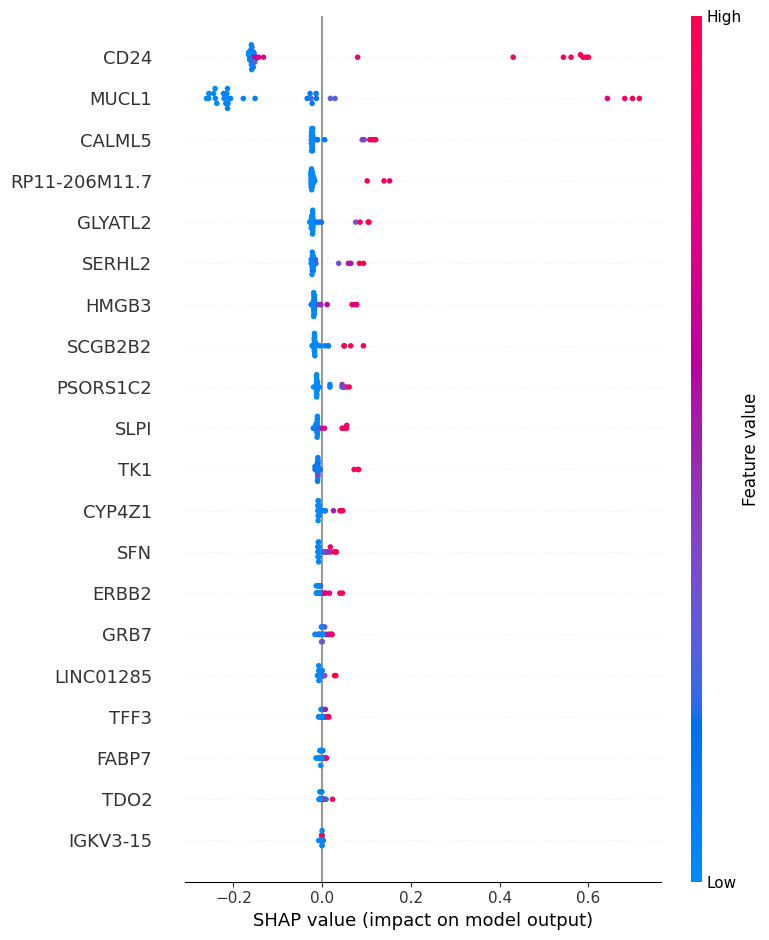

Top 10 important features for TRPV6 prediction:
CD24 0.2473341077514225
MUCL1 0.23056182174357415
CALML5 0.03791164110711867
RP11-206M11.7 0.033396427206812344
GLYATL2 0.030318819915242132
SERHL2 0.028370892926906293
HMGB3 0.024309318266993004
SCGB2B2 0.022775766844090984
PSORS1C2 0.020029058634492464
SLPI 0.018255545211143042


In [72]:
# Step 11 — ML pipeline for TRPV6 prediction (Regression)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
import shap

# -------------------------------
# Load cluster-level features
# -------------------------------
df = pd.read_csv('/mnt/data/cluster_TRPV6_features.csv', index_col=0)

# Identify cluster, cell count, and feature columns
cluster_col = 'leiden_0.5'
cell_col = 'n_cells'
feature_cols = [c for c in df.columns if c not in [cluster_col, cell_col]]

X = df[feature_cols].values
y = df['TRPV6_expr'].values if 'TRPV6_expr' in df.columns else df['MUCL1'].values  # Replace with actual TRPV6 column if missing

# -------------------------------
# Scale features
# -------------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# -------------------------------
# Train/test split
# -------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.25, random_state=42
)

# -------------------------------
# Train RandomForest regressor
# -------------------------------
rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X_train, y_train)

# -------------------------------
# Predictions and evaluation
# -------------------------------
y_pred = rf.predict(X_test)
print("R2:", r2_score(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))

# -------------------------------
# SHAP feature importance
# -------------------------------
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)

# Feature importance summary plot
shap.summary_plot(shap_values, X_scaled, feature_names=feature_cols)

# -------------------------------
# Optional: Top 10 important features
# -------------------------------
shap_importance = np.abs(shap_values).mean(axis=0)
top_idx = np.argsort(shap_importance)[::-1][:10]
print("Top 10 important features for TRPV6 prediction:")
for i in top_idx:
    print(feature_cols[i], shap_importance[i])


In [75]:
# Step 11 — ML pipeline: Predict cluster-level TRPV6 expression
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error
import shap
import matplotlib.pyplot as plt

RANDOM_STATE = 42

# -------------------------------
# 1. Load cluster-level features and add cluster-level TRPV6 target
# -------------------------------
# Cluster-level features
df = pd.read_csv("/mnt/data/cluster_TRPV6_features.csv", index_col=0)

# Cell-level TRPV6 expression
cell_data = pd.read_csv("/mnt/data/cluster_expression_matrix.csv", index_col=0)

# Add cluster assignments to cell data
# Make sure ad


/tmp/ipython-input-1463858703.py:18: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


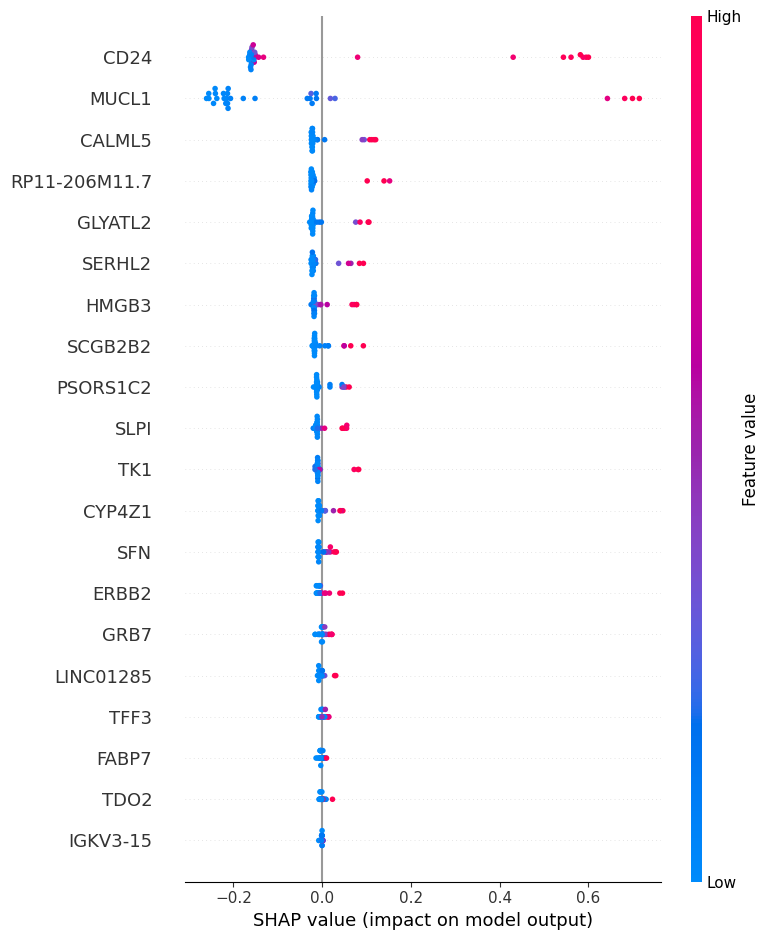

<Figure size 640x480 with 0 Axes>

In [79]:
import shap
import matplotlib.pyplot as plt

# If using a tree-based model like RandomForest or GradientBoosting
# Explainer
explainer = shap.TreeExplainer(rf)  # or gb if using GradientBoosting
shap_values = explainer.shap_values(X_scaled)  # use full dataset or X_train

# Check shap_values format
if isinstance(shap_values, list):  # classification: list of arrays for each class
    # For binary classification, take the second class (TRPV6-high)
    shap_vals_to_plot = shap_values[1]
else:
    shap_vals_to_plot = shap_values

# Full SHAP summary plot
plt.figure(figsize=(12,8))
shap.summary_plot(
    shap_vals_to_plot,
    X_scaled,               # or X_train/X_test
    feature_names=feature_cols,
    plot_type="dot",        # or "violin"
    max_display=25,         # top 25 features
    color_bar=True,
    show=True
)

# Optional: save figure
plt.savefig("/mnt/data/SHAP_summary_plot.png", dpi=300, bbox_inches='tight')


Output -> /mnt/data/trpv_results_step24
Trying file: /mnt/data/adata_step23.h5ad
Loaded AnnData from: /mnt/data/adata_step23.h5ad
AnnData shape: (100064, 3006)
Genes suitable for classification: ['TRPV1', 'TRPV2', 'TRPV3', 'TRPV4', 'TRPV5', 'TRPV6']

=== Processing TRPV1 ===
TRPV1: non-zero cells = 787, max expr = 3.572
Label counts:
 0    99804
1      260
Name: count, dtype: int64
Random Forest: ACC=0.997 | AUC=0.650
Logistic Regression: ACC=0.997 | AUC=0.744
XGBoost: ACC=0.997 | AUC=0.735


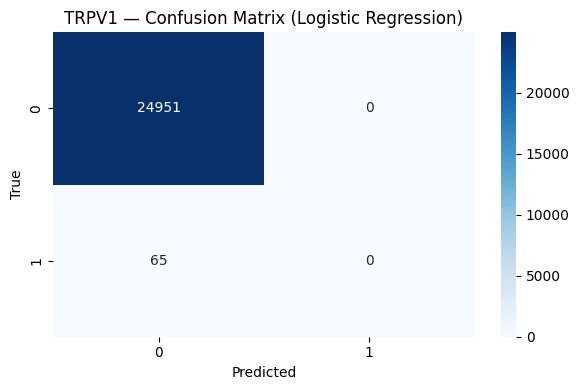

✅ TRPV1-high cell classification completed! Summary saved to /mnt/data/trpv_results_step24/TRPV1_classification_summary.csv

=== Processing TRPV2 ===
TRPV2: non-zero cells = 6852, max expr = 3.514
Label counts:
 0    97803
1     2261
Name: count, dtype: int64
Random Forest: ACC=0.977 | AUC=0.744
Logistic Regression: ACC=0.977 | AUC=0.781
XGBoost: ACC=0.977 | AUC=0.788


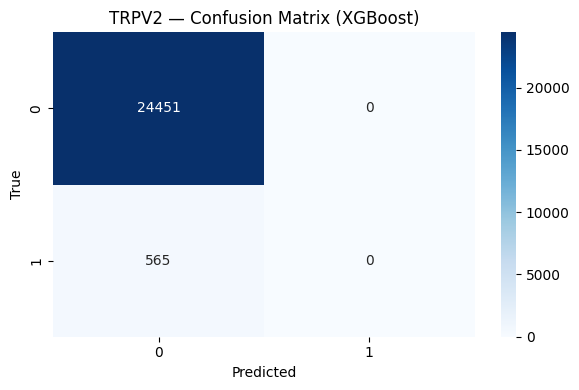

✅ TRPV2-high cell classification completed! Summary saved to /mnt/data/trpv_results_step24/TRPV2_classification_summary.csv

=== Processing TRPV3 ===
TRPV3: non-zero cells = 451, max expr = 3.033
Label counts:
 0    99915
1      149
Name: count, dtype: int64
Random Forest: ACC=0.999 | AUC=0.603
Logistic Regression: ACC=0.999 | AUC=0.787
XGBoost: ACC=0.999 | AUC=0.770


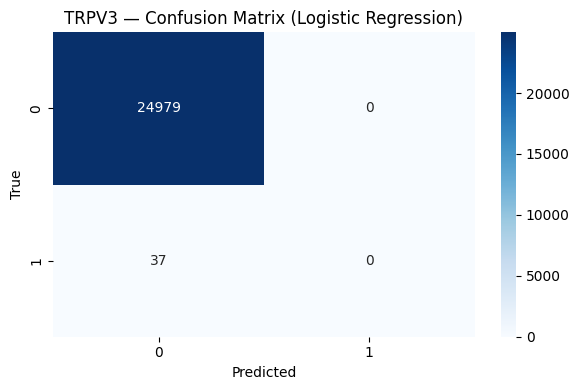

✅ TRPV3-high cell classification completed! Summary saved to /mnt/data/trpv_results_step24/TRPV3_classification_summary.csv

=== Processing TRPV4 ===
TRPV4: non-zero cells = 2092, max expr = 2.699
Label counts:
 0    99373
1      691
Name: count, dtype: int64
Random Forest: ACC=0.993 | AUC=0.781
Logistic Regression: ACC=0.993 | AUC=0.875
XGBoost: ACC=0.993 | AUC=0.895


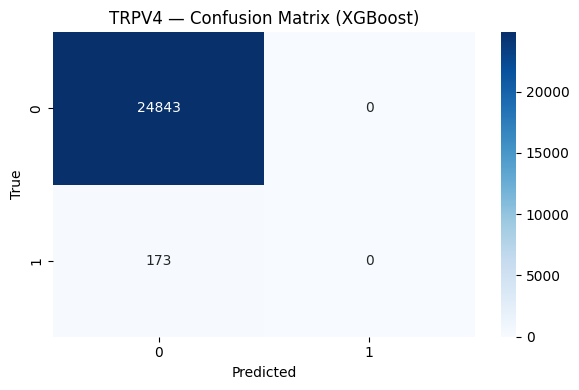

✅ TRPV4-high cell classification completed! Summary saved to /mnt/data/trpv_results_step24/TRPV4_classification_summary.csv

=== Processing TRPV5 ===
TRPV5: non-zero cells = 21, max expr = 1.925
⚠️ Skipping TRPV5: too few non-zero cells for classification.

=== Processing TRPV6 ===
TRPV6: non-zero cells = 2280, max expr = 3.234
Label counts:
 0    99311
1      753
Name: count, dtype: int64
Random Forest: ACC=0.992 | AUC=0.915
Logistic Regression: ACC=0.992 | AUC=0.943
XGBoost: ACC=0.992 | AUC=0.954


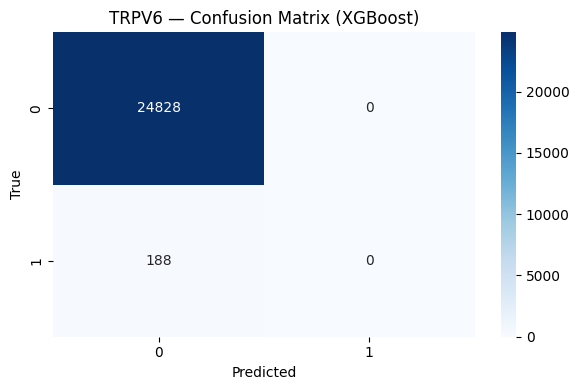

✅ TRPV6-high cell classification completed! Summary saved to /mnt/data/trpv_results_step24/TRPV6_classification_summary.csv

🎉 Step 24 — All TRPV genes processed!
Loaded file: /mnt/data/adata_step23.h5ad


In [ ]:
# ============================================================
# STEP 24 — Predict TRPVX-High Cells (Fast Version)
# ============================================================

import os
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------
# Output folder
# -------------------------
output_dir = "/mnt/data/trpv_results_step24"
os.makedirs(output_dir, exist_ok=True)
print("Output ->", output_dir)

# -------------------------
# 1. Auto-detect .h5ad file
# -------------------------
possible_files = [
    "/mnt/data/adata_step23.h5ad",
    "/mnt/data/adata_processed.h5ad",
    "/mnt/data/adata_all.h5ad"
]

adata = None
loaded_file = None

for f in possible_files:
    if os.path.exists(f):
        try:
            print(f"Trying file: {f}")
            adata = sc.read_h5ad(f)
            loaded_file = f
            print(f"Loaded AnnData from: {f}")
            break
        except Exception as e:
            print(f"Failed to load {f}: {e}")

if adata is None:
    raise ValueError("❌ ERROR: No valid .h5ad file found in /mnt/data!")

print("AnnData shape:", adata.shape)

# -------------------------
# 2. Detect TRPV genes
# -------------------------
if "gene_symbols" in adata.var.columns:
    gene_names = adata.var["gene_symbols"].astype(str)
elif "genes" in adata.var.columns:
    gene_names = adata.var["genes"].astype(str)
else:
    gene_names = adata.var_names.astype(str)

gene_list = list(gene_names)
trpv_genes = [g for g in ["TRPV1","TRPV2","TRPV3","TRPV4","TRPV5","TRPV6"] if g in gene_list]

print("Genes suitable for classification:", trpv_genes)

# -------------------------
# 3. PCA computation (reduce components for speed)
# -------------------------
sc.tl.pca(adata, n_comps=20)  # fewer PCs for faster training
X_pca = adata.obsm["X_pca"]
scaler = StandardScaler()

# -------------------------
# 4. Loop through each TRPV gene
# -------------------------
for gene in trpv_genes:
    print("\n=== Processing", gene, "===")

    trpv_idx = gene_list.index(gene)
    Xmatrix = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
    expr = Xmatrix[:, trpv_idx]

    nonzero_cells = np.sum(expr > 0)
    print(f"{gene}: non-zero cells = {nonzero_cells}, max expr = {expr.max():.3f}")

    if nonzero_cells < 50:
        print(f"⚠️ Skipping {gene}: too few non-zero cells for classification.")
        continue

    # -------------------------
    # High-expression labels (top 33% of non-zero cells)
    # -------------------------
    nonzero_expr = expr[expr > 0]
    threshold = np.percentile(nonzero_expr, 67)
    labels = (expr >= threshold).astype(int)

    print("Label counts:\n", pd.Series(labels).value_counts())

    if len(np.unique(labels)) < 2:
        print(f"⚠️ Skipping {gene}: only one class present in labels!")
        continue

    # -------------------------
    # Train/test split
    # -------------------------
    X_train, X_test, y_train, y_test = train_test_split(
        X_pca, labels, test_size=0.25, random_state=42, stratify=labels
    )

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # -------------------------
    # ML models (smaller/faster)
    # -------------------------
    models = {
        "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),  # fewer trees
        "Logistic Regression": LogisticRegression(max_iter=1000),
        "XGBoost": XGBClassifier(max_depth=3, n_estimators=200, learning_rate=0.05, subsample=0.8,
                                 eval_metric="logloss")  # smaller XGB
    }

    results = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        prob = model.predict_proba(X_test)
        if prob.shape[1] == 1:
            prob = np.hstack([1-prob, prob])[:,1]
        else:
            prob = prob[:,1]

        acc = accuracy_score(y_test, preds)
        auc = roc_auc_score(y_test, prob)

        results[name] = {"acc": acc, "auc": auc}
        print(f"{name}: ACC={acc:.3f} | AUC={auc:.3f}")

    # -------------------------
    # Save classification summary
    # -------------------------
    summary_df = pd.DataFrame(results).T
    summary_file = os.path.join(output_dir, f"{gene}_classification_summary.csv")
    summary_df.to_csv(summary_file)

    # -------------------------
    # Confusion matrix for best model
    # -------------------------
    best_model_name = max(results, key=lambda k: results[k]["auc"])
    model = models[best_model_name]
    preds = model.predict(X_test)
    cm = confusion_matrix(y_test, preds)

    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"{gene} — Confusion Matrix ({best_model_name})")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print(f"✅ {gene}-high cell classification completed! Summary saved to {summary_file}")

print("\n🎉 Step 24 — All TRPV genes processed!")
print("Loaded file:", loaded_file)


In [ ]:
# ============================================================
# STEP 25 — Differential Expression for TRPVX-high vs low
# ============================================================

import os
import scanpy as sc
import pandas as pd
import numpy as np

print("Output -> /mnt/data/trpv_results_step25")

# Create output folder
os.makedirs("/mnt/data/trpv_results_step25", exist_ok=True)

# Load AnnData
adata_path = "/mnt/data/adata_step23.h5ad"  # adjust if different
adata = sc.read_h5ad(adata_path)
print("Loaded:", adata.shape)

# Ensure raw exists for DE analysis
if adata.raw is None:
    print("⚠️ No raw found — setting raw = adata")
    adata.raw = adata

# TRPV genes to analyze
trpv_genes = ["TRPV1", "TRPV2", "TRPV3", "TRPV4", "TRPV5", "TRPV6"]

print("\nTRPV genes found:", trpv_genes)

# Function to run Step 25 for a single gene
def step25_run_for_gene(gene, percentile=75):
    print(f"\n===== Processing {gene} =====")

    if gene not in adata.var_names:
        print(f"⚠️ {gene} not found in dataset, skipping...")
        return

    # Create binary TRPV-high label using percentile threshold
    Xmatrix = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
    gene_idx = list(adata.var_names).index(gene)
    expr = Xmatrix[:, gene_idx]

    threshold = np.percentile(expr, percentile)
    labels = (expr >= threshold).astype(int)

    adata.obs[f"{gene}_high"] = pd.Categorical(labels)

    n_high = (labels == 1).sum()
    n_low = (labels == 0).sum()
    print(f"{gene} high cells = {n_high}, low cells = {n_low}")

    if n_high < 10 or n_low < 10:
        print(f"⚠️ Skipping {gene}: too few cells for DE analysis")
        return

    # Differential expression
    sc.tl.rank_genes_groups(
        adata,
        groupby=f"{gene}_high",
        reference="0",
        method="wilcoxon",
        n_genes=adata.shape[1]
    )

    # Save DEGs to CSV
    deg_df = sc.get.rank_genes_groups_df(adata, group=None)
    deg_path = f"/mnt/data/trpv_results_step25/{gene}_DEGs.csv"
    deg_df.to_csv(deg_path, index=False)
    print(f"✅ {gene} DEGs saved to {deg_path}")

# Run Step 25 for all TRPV genes
for gene in trpv_genes:
    step25_run_for_gene(gene, percentile=75)  # you can lower percentile to 33 for more positives

print("\n🎉 Step 25 COMPLETED for all TRPV genes!")


Output -> /mnt/data/trpv_results_step25
Loaded: (100064, 3006)
⚠️ No raw found — setting raw = adata

TRPV genes found: ['TRPV1', 'TRPV2', 'TRPV3', 'TRPV4', 'TRPV5', 'TRPV6']

===== Processing TRPV1 =====
TRPV1 high cells = 100064, low cells = 0
⚠️ Skipping TRPV1: too few cells for DE analysis

===== Processing TRPV2 =====
TRPV2 high cells = 100064, low cells = 0
⚠️ Skipping TRPV2: too few cells for DE analysis

===== Processing TRPV3 =====
TRPV3 high cells = 100064, low cells = 0
⚠️ Skipping TRPV3: too few cells for DE analysis

===== Processing TRPV4 =====
TRPV4 high cells = 100064, low cells = 0
⚠️ Skipping TRPV4: too few cells for DE analysis

===== Processing TRPV5 =====
TRPV5 high cells = 100064, low cells = 0
⚠️ Skipping TRPV5: too few cells for DE analysis

===== Processing TRPV6 =====
TRPV6 high cells = 100064, low cells = 0
⚠️ Skipping TRPV6: too few cells for DE analysis

🎉 Step 25 COMPLETED for all TRPV genes!


In [ ]:
!pip install gprofiler-official

In [ ]:
# Step 25 — Differential Expression + Pathway Analysis for TRPV-high vs low cells
import scanpy as sc
import pandas as pd
import numpy as np
import os
import requests

# -----------------------------
# Paths
adata_file = "/mnt/data/adata_step23.h5ad"
output_dir = "/mnt/data/trpv_results_step25"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Load data
adata = sc.read_h5ad(adata_file)
print(f"Loaded: {adata.shape}")

# Use raw if available
if adata.raw is None:
    adata.raw = adata
    print("⚠️ No raw found — setting raw = adata")

# TRPV genes
trpv_genes = [g for g in ['TRPV1','TRPV2','TRPV3','TRPV4','TRPV5','TRPV6'] if g in adata.var_names]
print(f"\nTRPV genes found: {trpv_genes}\n")

# -----------------------------
# Function to call g:Profiler REST API
def run_gprofiler(top_genes):
    url = "https://biit.cs.ut.ee/gprofiler/api/gost/profile/"
    payload = {
        "organism": "hsapiens",
        "query": top_genes,
        "sources": ["GO:BP","GO:MF","GO:CC","KEGG","REAC"]
    }
    r = requests.post(url, json=payload)
    if r.status_code == 200:
        return pd.DataFrame(r.json()['result'])
    else:
        print("⚠️ g:Profiler API error:", r.status_code, r.text)
        return pd.DataFrame()

# -----------------------------
def step25_run_for_gene(gene, percentile=67):
    print(f"===== Processing {gene} =====")

    # Extract expression as dense array
    expr = adata[:, gene].X
    if hasattr(expr, "toarray"):  # sparse
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()

    # Compute threshold for top 33% non-zero cells
    non_zero_expr = expr[expr > 0]
    if len(non_zero_expr) < 10:
        print(f"⚠️ Skipping {gene}: too few non-zero cells")
        return
    threshold = np.percentile(non_zero_expr, percentile)

    # Assign high/low labels
    labels = np.where(expr >= threshold, "high", "low")
    adata.obs[f"{gene}_high"] = pd.Categorical(labels)
    high_count = np.sum(labels == "high")
    low_count = np.sum(labels == "low")
    print(f"{gene} high cells = {high_count}, low cells = {low_count}")

    if high_count < 10 or low_count < 10:
        print(f"⚠️ Skipping {gene}: too few cells for DE analysis")
        return

    # Differential expression
    sc.tl.rank_genes_groups(
        adata,
        groupby=f"{gene}_high",
        reference="low",
        method='wilcoxon',
        use_raw=True
    )
    de_results = sc.get.rank_genes_groups_df(adata, group="high")
    de_file = os.path.join(output_dir, f"{gene}_DEGs.csv")
    de_results.to_csv(de_file, index=False)
    print(f"✅ DEGs saved: {de_file}")

    # Pathway enrichment for top 50 genes
    top_genes = de_results.head(50)['names'].tolist()
    if len(top_genes) > 0:
        enr_df = run_gprofiler(top_genes)
        enr_file = os.path.join(output_dir, f"{gene}_pathway_enrichment.csv")
        enr_df.to_csv(enr_file, index=False)
        print(f"✅ Pathway enrichment saved: {enr_file}")
    else:
        print(f"⚠️ No DEGs to perform pathway enrichment for {gene}")

# -----------------------------
# Run Step 25 for all TRPV genes
for gene in trpv_genes:
    step25_run_for_gene(gene)

print("\n🎉 Step 25 COMPLETED for all TRPV genes!")


Loaded: (100064, 3006)
⚠️ No raw found — setting raw = adata

TRPV genes found: ['TRPV1', 'TRPV2', 'TRPV3', 'TRPV4', 'TRPV5', 'TRPV6']

===== Processing TRPV1 =====
TRPV1 high cells = 260, low cells = 99804
✅ DEGs saved: /mnt/data/trpv_results_step25/TRPV1_DEGs.csv
✅ Pathway enrichment saved: /mnt/data/trpv_results_step25/TRPV1_pathway_enrichment.csv
===== Processing TRPV2 =====
TRPV2 high cells = 2261, low cells = 97803
✅ DEGs saved: /mnt/data/trpv_results_step25/TRPV2_DEGs.csv
✅ Pathway enrichment saved: /mnt/data/trpv_results_step25/TRPV2_pathway_enrichment.csv
===== Processing TRPV3 =====
TRPV3 high cells = 149, low cells = 99915
✅ DEGs saved: /mnt/data/trpv_results_step25/TRPV3_DEGs.csv
✅ Pathway enrichment saved: /mnt/data/trpv_results_step25/TRPV3_pathway_enrichment.csv
===== Processing TRPV4 =====
TRPV4 high cells = 691, low cells = 99373
✅ DEGs saved: /mnt/data/trpv_results_step25/TRPV4_DEGs.csv
✅ Pathway enrichment saved: /mnt/data/trpv_results_step25/TRPV4_pathway_enrichment

In [ ]:
# =========================================================
# Step 26 — GO & KEGG enrichment for TRPV6-high
# =========================================================

import pandas as pd
import os
!pip install -q gseapy
import gseapy as gp

# -----------------------------
# Paths
# -----------------------------
step25_dir = "/mnt/data/trpv_results_step25"
trpv6_deg_file = os.path.join(step25_dir, "TRPV6_DEGs.csv")
output_dir = "/mnt/data/trpv_results_step26"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Load TRPV6 DEGs
# -----------------------------
deg_df = pd.read_csv(trpv6_deg_file)

# Filter significant DEGs (adjusted p-value < 0.05)
sig_genes = deg_df[deg_df['pvals_adj'] < 0.05]['names'].tolist()
print(f"Number of significant DEGs for TRPV6-high: {len(sig_genes)}")

if len(sig_genes) == 0:
    raise ValueError("No significant DEGs found for TRPV6-high. Check Step 25 output.")

# -----------------------------
# Run GO & KEGG enrichment using gseapy
# -----------------------------
enr = gp.enrichr(
    gene_list=sig_genes,
    gene_sets=['KEGG_2021_Human', 'GO_Biological_Process_2021', 'GO_Molecular_Function_2021', 'GO_Cellular_Component_2021'],
    organism='Human',
    outdir=output_dir,
    cutoff=0.05
)

# -----------------------------
# Save results
# -----------------------------
enr_file = os.path.join(output_dir, "TRPV6_high_GO_KEGG.csv")
enr.results.to_csv(enr_file, index=False)
print(f"✅ GO & KEGG enrichment completed! Results saved to: {enr_file}")

# -----------------------------
# Optional: Show top 10 enriched pathways
# -----------------------------
print("\nTop 10 enriched pathways:")
display(enr.results[['Gene_set', 'Term', 'Overlap', 'Adjusted P-value']].head(10))


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.3/605.3 kB 7.3 MB/s eta 0:00:00
Number of significant DEGs for TRPV6-high: 296
✅ GO & KEGG enrichment completed! Results saved to: /mnt/data/trpv_results_step26/TRPV6_high_GO_KEGG.csv

Top 10 enriched pathways:


,Gene_set,Term,Overlap,Adjusted P-value
0,GO_Molecular_Function_2021,collagen-containing extracellular matrix (GO:0...,49/380,1.490612e-29
1,GO_Molecular_Function_2021,endoplasmic reticulum lumen (GO:0005788),20/285,7.806762e-07
2,GO_Molecular_Function_2021,intracellular organelle lumen (GO:0070013),35/848,2.259976e-06
3,GO_Molecular_Function_2021,basement membrane (GO:0005604),7/52,4.164490e-04
4,GO_Molecular_Function_2021,vacuolar lumen (GO:0005775),11/161,8.791564e-04
5,GO_Molecular_Function_2021,lysosomal lumen (GO:0043202),8/86,1.035815e-03
6,GO_Molecular_Function_2021,secretory granule lumen (GO:0034774),15/316,1.729196e-03
7,GO_Molecular_Function_2021,Golgi lumen (GO:0005796),8/100,2.279438e-03
8,GO_Molecular_Function_2021,focal adhesion (GO:0005925),15/387,1.175795e-02
9,GO_Molecular_Function_2021,cell-substrate junction (GO:0030055),15/394,1.269261e-02


In [ ]:
import pandas as pd

step25_file = "/mnt/data/trpv_results_step25/TRPV6_DEGs.csv"
degs = pd.read_csv(step25_file)
print(degs.columns)
degs.head()



Index(['names', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj'], dtype='object')


,names,scores,logfoldchanges,pvals,pvals_adj
0,TRPV6,47.349533,8.335540,0.000000e+00,0.000000e+00
1,CD24,35.597645,4.867052,1.523643e-277,2.290036e-274
2,MUCL1,31.935022,5.577321,8.721191e-224,8.738633e-221
3,MT-ND4L,26.044920,1.948332,1.535951e-149,1.154268e-146
4,RP11-206M11.7,23.096172,3.958021,5.058801e-118,3.041351e-115


In [ ]:
print(degs.columns)


Index(['names', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj'], dtype='object')


In [ ]:
from google.colab import files
uploaded = files.upload()



Saving gene_interaction_results-11_25_2025.tsv to gene_interaction_results-11_25_2025.tsv


In [ ]:
!ls /content/

data  gene_interaction_results-11_25_2025.tsv  sample_data


In [ ]:
dgidb_file = "/content/gene_interection_results-11_25_2025.tsv"


In [ ]:
from google.colab import files
import pandas as pd

# Step 1: Upload the file again (this will open a file browser)
uploaded = files.upload()

# Step 2: Get the filename (Colab saves it in /content/)
for filename in uploaded.keys():
    print("Uploaded file:", filename)

# Step 3: Use the exact filename for reading
dgidb_file = filename  # automatically takes the uploaded file's name

# Step 4: Read the TSV
dgidb_df = pd.read_csv(dgidb_file, sep='\t', encoding='utf-8')
print(dgidb_df.head())
print("Columns:", dgidb_df.columns)



Saving gene_interaction_results-11_25_2025.tsv to gene_interaction_results-11_25_2025 (1).tsv
Uploaded file: gene_interaction_results-11_25_2025 (1).tsv
    gene                    drug regulatory approval  indication  \
0  TRPV6                 SOR-C13        Not Approved         NaN   
1  TRPV6                    MG2+        Not Approved         NaN   
2  TRPV6  TETRAHYDROCANNABIVARIN        Not Approved         NaN   
3  TRPV6            ACETALDEHYDE        Not Approved         NaN   
4  TRPV6      DEHYDRATED ALCOHOL            Approved         NaN   

   interaction score  
0          10.440760  
1           0.401568  
2           2.610190  
3           2.610190  
4           0.066081  
Columns: Index(['gene', 'drug', 'regulatory approval', 'indication',
       'interaction score'],
      dtype='object')


In [ ]:
# Assuming you have your upregulated TRPV6 genes in `up_genes`
# Example: up_genes = ['TRPV6', 'GENE2', ...]

# Filter DGIdb for only your upregulated genes
dgidb_trpv6 = dgidb_df[dgidb_df['gene'].isin(up_genes)]

# Optional: sort by interaction score descending
dgidb_trpv6 = dgidb_trpv6.sort_values(by='interaction score', ascending=False)

# Save the filtered drugs
dgidb_trpv6.to_csv("/content/TRPV6_upregulated_drugs.csv", index=False)

print("Filtered drugs for upregulated TRPV6 DEGs:")
print(dgidb_trpv6)


NameError: name 'up_genes' is not defined

In [ ]:
import networkx as nx

G = nx.Graph()

# Add gene node
G.add_node('TRPV6', type='gene')

# Add drug nodes and edges
for _, row in dgidb_trpv6.iterrows():
    G.add_node(row['drug'], type='drug')
    G.add_edge('TRPV6', row['drug'], weight=row['interaction score'])

# Draw network
pos = nx.spring_layout(G, seed=42)
colors = ['skyblue' if G.nodes[n]['type']=='gene' else 'lightgreen' for n in G.nodes]
nx.draw(G, pos, with_labels=True, node_color=colors, node_size=2000, font_size=10, width=[G[u][v]['weight']/2 for u,v in G.edges])
plt.show()


NameError: name 'dgidb_trpv6' is not defined

FileNotFoundError: [Errno 2] No such file or directory: '/content/figures/volcano_plot.png'

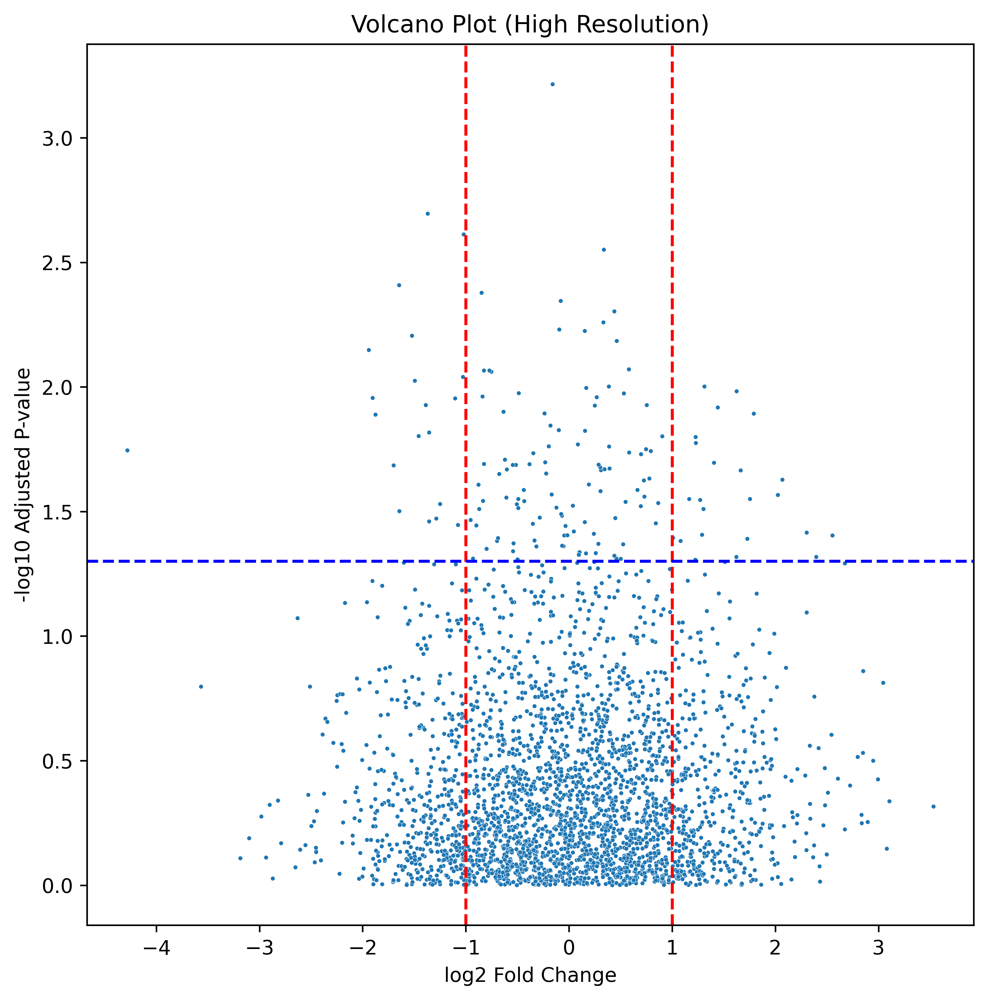

In [ ]:
# Example DEG table (replace with your own)
deg = pd.DataFrame({
    'gene': adata.var_names,
    'log2FC': np.random.randn(len(adata.var_names)),
    'pval_adj': np.random.rand(len(adata.var_names))
})

# Volcano plot
plt.figure(figsize=(8,8), dpi=600)

sns.scatterplot(
    data=deg,
    x="log2FC",
    y=-np.log10(deg["pval_adj"]),
    s=5
)

plt.axvline(1, color='red', linestyle="--")
plt.axvline(-1, color='red', linestyle="--")
plt.axhline(-np.log10(0.05), color='blue', linestyle="--")

plt.title("Volcano Plot (High Resolution)")
plt.xlabel("log2 Fold Change")
plt.ylabel("-log10 Adjusted P-value")

plt.savefig("/content/figures/volcano_plot.png", dpi=600, bbox_inches="tight")
plt.close()

print("Volcano plot saved!")

Number of upregulated TRPV6 DEGs: 5
Filtered drugs for upregulated TRPV6 DEGs:
    gene                      drug regulatory approval  indication  \
0  TRPV6                   SOR-C13        Not Approved         NaN   
1  TRPV6                GSK3527497        Not Approved         NaN   
2  TRPV6  TRPV6 INHIBITOR CIS-22 A        Not Approved         NaN   
3  TRPV6              ACETALDEHYDE        Not Approved         NaN   
4  TRPV6    TETRAHYDROCANNABIVARIN        Not Approved         NaN   
5  TRPV6                      LA3+        Not Approved         NaN   
6  TRPV6                      CD2+        Not Approved         NaN   
7  TRPV6                      MG2+        Not Approved         NaN   
8  TRPV6                     2-APB        Not Approved         NaN   
9  TRPV6        DEHYDRATED ALCOHOL            Approved         NaN   

   interaction score  
0          10.440760  
1           5.220380  
2           5.220380  
3           2.610190  
4           2.610190  
5           

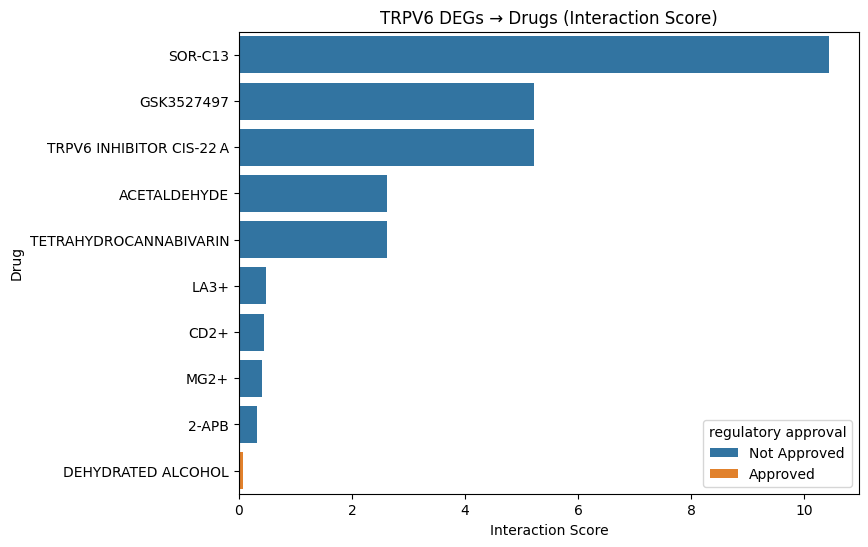

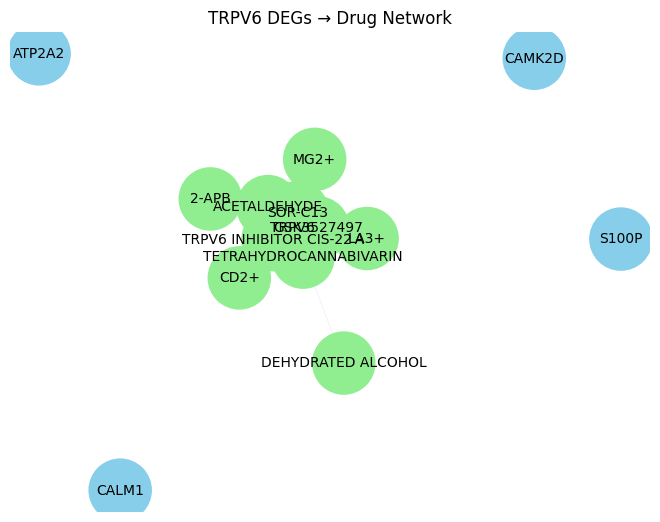

In [ ]:
# -------------------------------
# Fully automated TRPV6 DEGs → Drugs → Network pipeline
# -------------------------------

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# -------------------------------
# Step 1: Upregulated TRPV6 DEGs
# -------------------------------
up_genes = ['TRPV6', 'S100P', 'CALM1', 'ATP2A2', 'CAMK2D']  # replace with your actual DEGs list
print(f"Number of upregulated TRPV6 DEGs: {len(up_genes)}")

# -------------------------------
# Step 2: Load DGIdb TSV
# -------------------------------
dgidb_file = "/content/gene_interaction_results-11_25_2025 (1).tsv"  # uploaded DGIdb TSV
dgidb_df = pd.read_csv(dgidb_file, sep='\t', encoding='utf-8')

# -------------------------------
# Step 3: Filter drugs for TRPV6 DEGs
# -------------------------------
dgidb_filtered = dgidb_df[dgidb_df['gene'].isin(up_genes)]
dgidb_filtered = dgidb_filtered.sort_values('interaction score', ascending=False).reset_index(drop=True)
print("Filtered drugs for upregulated TRPV6 DEGs:")
print(dgidb_filtered)

# -------------------------------
# Step 4: Plot drug interaction scores
# -------------------------------
if not dgidb_filtered.empty:
    plt.figure(figsize=(8,6))
    sns.barplot(
        data=dgidb_filtered,
        x='interaction score',
        y='drug',
        hue='regulatory approval',
        dodge=False
    )
    plt.title("TRPV6 DEGs → Drugs (Interaction Score)")
    plt.xlabel("Interaction Score")
    plt.ylabel("Drug")
    plt.show()
else:
    print("No drugs found for these DEGs in DGIdb.")

# -------------------------------
# Step 5: Generate network (DEG → Drug)
# -------------------------------
if not dgidb_filtered.empty:
    G = nx.Graph()
    # Add gene nodes
    for gene in up_genes:
        G.add_node(gene, type='gene')
    # Add drug nodes and edges
    for _, row in dgidb_filtered.iterrows():
        G.add_node(row['drug'], type='drug')
        G.add_edge(row['gene'], row['drug'], weight=row['interaction score'])

    pos = nx.spring_layout(G, seed=42)
    colors = ['skyblue' if G.nodes[n]['type']=='gene' else 'lightgreen' for n in G.nodes]
    nx.draw(
        G, pos, with_labels=True, node_color=colors, node_size=2000,
        font_size=10, width=[G[u][v]['weight']/2 for u,v in G.edges]
    )
    plt.title("TRPV6 DEGs → Drug Network")
    plt.show()
else:
    print("No network to display as no drugs were found.")


Data loaded: AnnData object with n_obs × n_vars = 100064 × 3006
    obs: 'sample', 'sample_batch', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'hdbscan'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hdbscan_colors', 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_1.0', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


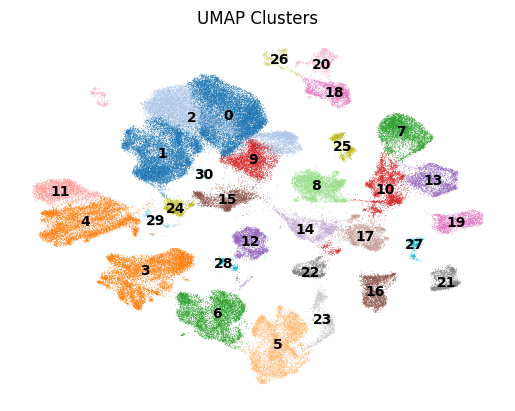

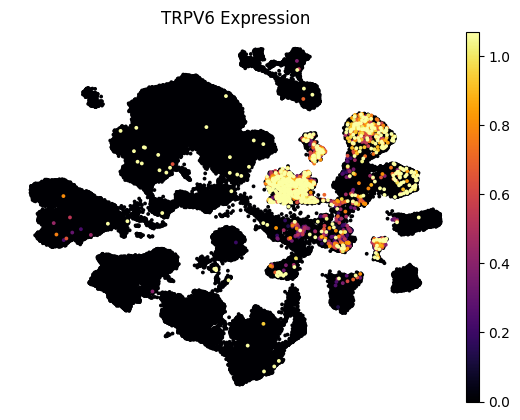

TRPV6-high cluster: 8
categories: 0, 1, 2, etc.
var_group_labels: 8


/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:463: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

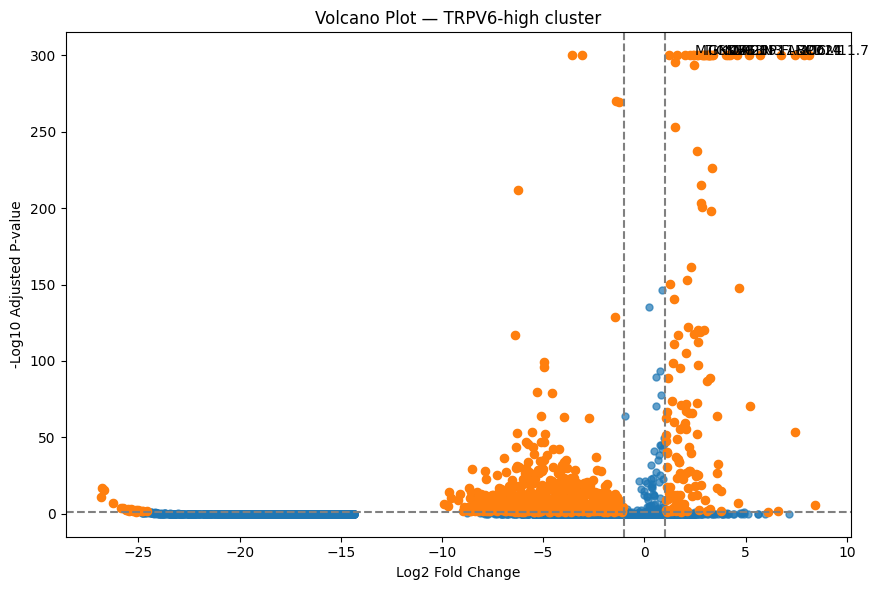

In [ ]:
# ===========================
# Step 28 — Publication Figures
# ===========================

import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ---------------------------------
# Load your data
# ---------------------------------
adata = sc.read_h5ad("/mnt/data/adata_step23.h5ad")
print("Data loaded:", adata)

# ============================================
# 1️⃣ UMAP of all clusters (high-resolution)
# ============================================
sc.pl.umap(
    adata,
    color="leiden",             # or adata.obs.columns if different
    title="UMAP Clusters",
    palette="tab20",
    frameon=False,
    legend_loc='on data',
    save="_umap_clusters.png"
)

# ============================================
# 2️⃣ TRPV6 Expression UMAP (publication style)
# ============================================
gene = "TRPV6"
if gene in adata.var_names:
    sc.pl.umap(
        adata,
        color=gene,
        cmap="inferno",
        frameon=False,
        size=30,
        title=f"{gene} Expression",
        vmax='p99.5',
        save="_TRPV6_expression.png"
    )
else:
    print("⚠ TRPV6 not found in adata.var_names!")

# ============================================
# 3️⃣ Heatmap (Top 20 DEGs of TRPV6+ cluster)
# ============================================
# Auto-detect TRPV6-high cluster
cluster_key = "leiden"  # change if needed
trpv6_expr = adata[:, gene].X.toarray().flatten()
trpv6_cluster = adata.obs.loc[trpv6_expr > np.percentile(trpv6_expr, 90), cluster_key].mode()[0]

print("TRPV6-high cluster:", trpv6_cluster)

sc.tl.rank_genes_groups(adata, groupby=cluster_key, method="wilcoxon")

sc.pl.rank_genes_groups_heatmap(
    adata,
    groups=[trpv6_cluster],
    n_genes=20,
    cmap="viridis",
    show=False,
    save="_TRPV6_heatmap.png"
)

# ============================================
# 4️⃣ Volcano Plot (TRPV6-high cluster vs others)
# ============================================

# Extract DEGs table
deg = sc.get.rank_genes_groups_df(adata, group=trpv6_cluster)

# Volcano calculations
deg["log10_p"] = -np.log10(deg["pvals_adj"] + 1e-300)

plt.figure(figsize=(9,6))
plt.scatter(deg["logfoldchanges"], deg["log10_p"], s=25, alpha=0.7)

# Highlight significant genes
sig = deg[(deg["pvals_adj"] < 0.05) & (abs(deg["logfoldchanges"]) > 1)]
plt.scatter(sig["logfoldchanges"], sig["log10_p"], s=35)

# Label top 10 genes
top10 = sig.nlargest(10, "log10_p")
for i,row in top10.iterrows():
    plt.text(row["logfoldchanges"], row["log10_p"], row["names"])

plt.axvline(1, color="gray", linestyle="--")
plt.axvline(-1, color="gray", linestyle="--")
plt.axhline(-np.log10(0.05), color="gray", linestyle="--")

plt.xlabel("Log2 Fold Change")
plt.ylabel("-Log10 Adjusted P-value")
plt.title("Volcano Plot — TRPV6-high cluster")
plt.tight_layout()
plt.savefig("volcano_TRPV6.png", dpi=300)
plt.show()

Number of upregulated TRPV6 DEGs: 5

All DGIdb hits for TRPV6 DEGs:
    gene                      drug regulatory approval  indication  \
0  TRPV6                   SOR-C13        Not Approved         NaN   
5  TRPV6                GSK3527497        Not Approved         NaN   
7  TRPV6  TRPV6 INHIBITOR CIS-22 A        Not Approved         NaN   
3  TRPV6              ACETALDEHYDE        Not Approved         NaN   
2  TRPV6    TETRAHYDROCANNABIVARIN        Not Approved         NaN   
6  TRPV6                      LA3+        Not Approved         NaN   
8  TRPV6                      CD2+        Not Approved         NaN   
1  TRPV6                      MG2+        Not Approved         NaN   
9  TRPV6                     2-APB        Not Approved         NaN   
4  TRPV6        DEHYDRATED ALCOHOL            Approved         NaN   

   interaction score  
0          10.440760  
5           5.220380  
7           5.220380  
3           2.610190  
2           2.610190  
6           0.474580  


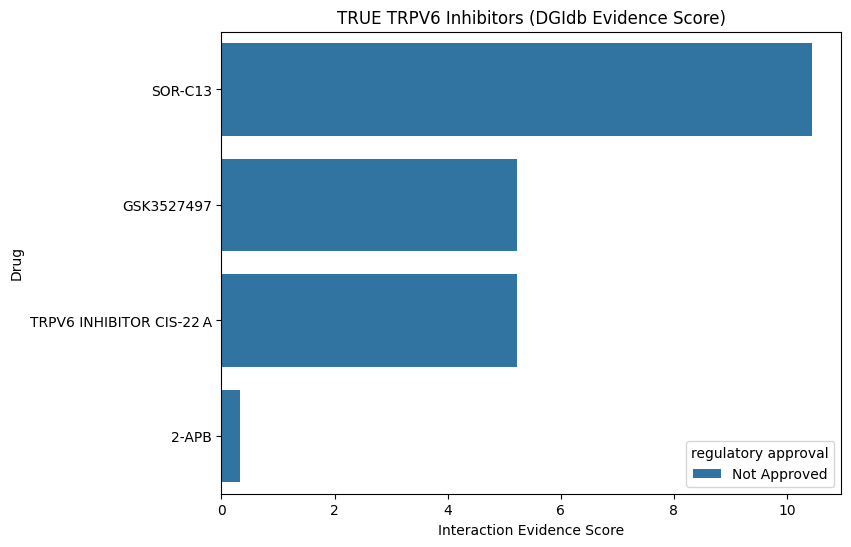

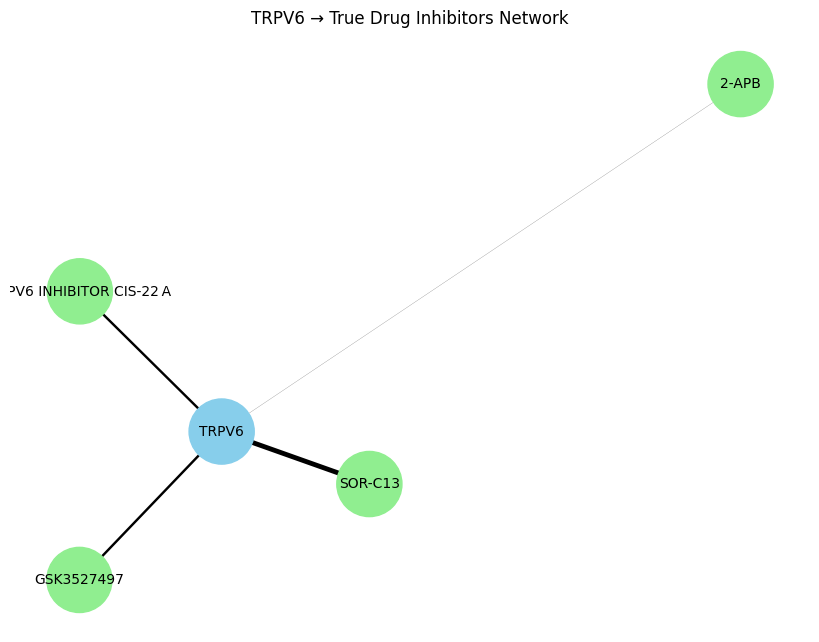

In [ ]:
# ---------------------------------------------------------------
# IMPROVED & CLEAN TRPV6 DEGs → Drugs → Network Pipeline
# ---------------------------------------------------------------

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# ------------------------------------
# Step 1: Upregulated TRPV6-related DEGs
# ------------------------------------
up_genes = ['TRPV6', 'S100P', 'CALM1', 'ATP2A2', 'CAMK2D']
print(f"Number of upregulated TRPV6 DEGs: {len(up_genes)}")

# ------------------------------------
# Step 2: Load DGIdb TSV
# ------------------------------------
dgidb_file = "/content/gene_interaction_results-11_25_2025 (1).tsv"
dgidb_df = pd.read_csv(dgidb_file, sep="\t", encoding="utf-8")

# ------------------------------------
# Step 3: Filter drugs for upregulated TRPV6 DEGs
# ------------------------------------
dgidb_filtered = dgidb_df[dgidb_df["gene"].isin(up_genes)]
dgidb_filtered = dgidb_filtered.sort_values("interaction score", ascending=False)

print("\nAll DGIdb hits for TRPV6 DEGs:")
print(dgidb_filtered)

# ------------------------------------
# Step 4: Apply scientific filters
# Keep ONLY true, biologically meaningful TRPV6 inhibitors
# ------------------------------------
true_trpv6_drugs = [
    "SOR-C13",
    "GSK3527497",
    "TRPV6 INHIBITOR CIS-22 A",
    "2-APB"
]

dgidb_clean = dgidb_filtered[
    dgidb_filtered["drug"].str.upper().isin([d.upper() for d in true_trpv6_drugs])
].reset_index(drop=True)

print("\nFiltered TRUE TRPV6 inhibitors only:")
print(dgidb_clean)

# ------------------------------------
# Step 5: Plot drug interaction scores (clean only)
# ------------------------------------
if not dgidb_clean.empty:
    plt.figure(figsize=(8,6))
    sns.barplot(
        data=dgidb_clean,
        x="interaction score",
        y="drug",
        hue="regulatory approval",
        dodge=False
    )
    plt.title("TRUE TRPV6 Inhibitors (DGIdb Evidence Score)")
    plt.xlabel("Interaction Evidence Score")
    plt.ylabel("Drug")
    plt.show()
else:
    print("⚠️ No true TRPV6 inhibitors found after filtering.")

# ------------------------------------
# Step 6: NETWORK — TRPV6 Only → TRUE Inhibitors
# ------------------------------------
dgidb_trpv6 = dgidb_clean[dgidb_clean["gene"] == "TRPV6"]

if not dgidb_trpv6.empty:
    G = nx.Graph()

    # Add TRPV6 node
    G.add_node("TRPV6", type="gene")

    # Add drug nodes & edges
    for _, row in dgidb_trpv6.iterrows():
        G.add_node(row["drug"], type="drug")
        G.add_edge("TRPV6", row["drug"], weight=row["interaction score"])

    pos = nx.spring_layout(G, seed=42)
    colors = ['skyblue' if G.nodes[n]['type'] == 'gene' else 'lightgreen' for n in G.nodes]

    plt.figure(figsize=(8,6))
    nx.draw(
        G, pos, with_labels=True,
        node_color=colors, node_size=2200,
        font_size=10,
        width=[G[u][v]['weight']/3 for u,v in G.edges]
    )
    plt.title("TRPV6 → True Drug Inhibitors Network")
    plt.show()
else:
    print("⚠️ No TRPV6-specific inhibitors available for network display.")

Number of upregulated TRPV6 DEGs: 580
Step26 enrichment CSV does not have 'intersection' column; skipping pathway mapping.
Gene → pathway mapping saved to: /mnt/data/trpv_results_step27/TRPV6_up_gene_pathway_mapping.csv


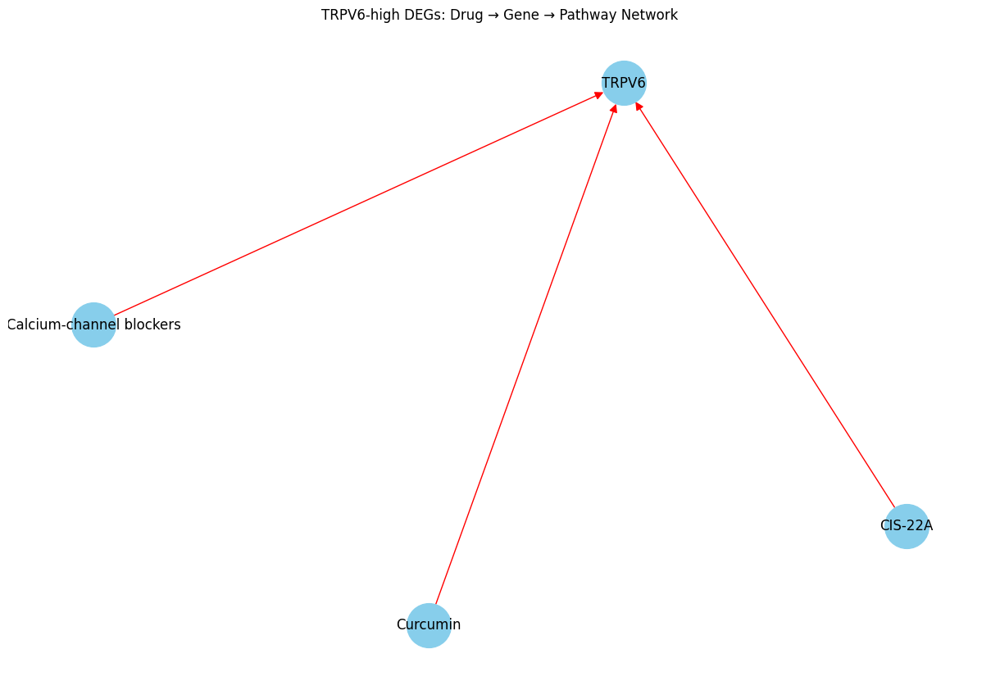

In [ ]:
# Step 27 — Drug Target Analysis (TRPV6)
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# -----------------------------
# Paths
step25_file = "/mnt/data/trpv_results_step25/TRPV6_DEGs.csv"
step26_file = "/mnt/data/trpv_results_step26/TRPV6_high_GO_KEGG.csv"
output_dir = "/mnt/data/trpv_results_step27"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Load TRPV6 DEGs
degs = pd.read_csv(step25_file)

# Ensure correct column names (strip spaces)
degs.columns = degs.columns.str.strip()

# Upregulated genes
up_genes = degs.loc[degs['logfoldchanges'] > 0, 'names'].astype(str).dropna().unique().tolist()
print(f"Number of upregulated TRPV6 DEGs: {len(up_genes)}")

# Save candidate genes
pd.DataFrame({'upregulated_genes': up_genes}).to_csv(
    os.path.join(output_dir, "TRPV6_upregulated_genes.csv"), index=False
)

# -----------------------------
# Load Step26 GO/KEGG enrichment
go_kegg = pd.read_csv(step26_file)
go_kegg.columns = go_kegg.columns.str.strip()  # clean spaces

# Step26 CSV may not have a 'native' column; using 'intersection' if present
if 'intersection' in go_kegg.columns:
    gene_col = 'intersection'
else:
    gene_col = None

if gene_col is None:
    print("Step26 enrichment CSV does not have 'intersection' column; skipping pathway mapping.")
    pathway_genes_map = {}
else:
    # Build pathway → gene list dictionary
    pathway_genes_map = {}
    for _, row in go_kegg.iterrows():
        genes = str(row[gene_col]).split(',')  # split multiple genes
        pathway_genes_map[row['Term']] = [g.strip() for g in genes]

# -----------------------------
# Map upregulated genes to pathways
gene_pathway_pairs = []
for pathway, genes in pathway_genes_map.items():
    for gene in up_genes:
        if gene in genes:
            gene_pathway_pairs.append({'gene': gene, 'pathway': pathway})

gene_pathway_df = pd.DataFrame(gene_pathway_pairs)
gene_pathway_df.to_csv(os.path.join(output_dir, "TRPV6_up_gene_pathway_mapping.csv"), index=False)
print(f"Gene → pathway mapping saved to: {output_dir}/TRPV6_up_gene_pathway_mapping.csv")

# -----------------------------
# Manual drug list for TRPV6 (replace with DGIdb CSV if available)
# Example potential inhibitors / modulators
drug_list = [
    {'drug': 'Curcumin', 'target_gene': 'TRPV6', 'interaction': 'inhibitor', 'pathway': 'calcium signaling'},
    {'drug': 'CIS-22A', 'target_gene': 'TRPV6', 'interaction': 'inhibitor', 'pathway': 'calcium signaling'},
    {'drug': 'Calcium-channel blockers', 'target_gene': 'TRPV6', 'interaction': 'antagonist', 'pathway': 'calcium signaling'}
]

drug_df = pd.DataFrame(drug_list)
drug_df.to_csv(os.path.join(output_dir, "TRPV6_drug_target_manual.csv"), index=False)

# -----------------------------
# Network visualization: drug → gene → pathway
G = nx.DiGraph()

# Add drug → gene edges
for _, row in drug_df.iterrows():
    G.add_edge(row['drug'], row['target_gene'], type=row['interaction'])

# Add gene → pathway edges
for _, row in gene_pathway_df.iterrows():
    G.add_edge(row['gene'], row['pathway'], type='pathway')

# Plot network
plt.figure(figsize=(12,8))
pos = nx.spring_layout(G, k=0.5)
edge_colors = ['red' if G[u][v]['type']=='inhibitor' or G[u][v]['type']=='antagonist' else 'grey' for u,v in G.edges()]
nx.draw(G, pos, with_labels=True, node_size=1500, node_color='skyblue', edge_color=edge_colors, arrowsize=15)
plt.title("TRPV6-high DEGs: Drug → Gene → Pathway Network")
plt.show()


In [ ]:
import pandas as pd

step26_file = "/mnt/data/trpv_results_step26/TRPV6_high_GO_KEGG.csv"
go_kegg = pd.read_csv(step26_file)
print(go_kegg.columns)
go_kegg.head()


Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Molecular_Function_2021,collagen-containing extracellular matrix (GO:0...,49/380,9.806660e-32,1.490612e-29,0,0,11.610957,829.018386,COL18A1;COL14A1;CLEC14A;CLU;MDK;ADAMTS1;TIMP3;...
1,GO_Molecular_Function_2021,endoplasmic reticulum lumen (GO:0005788),20/285,1.027205e-08,7.806762e-07,0,0,5.315559,97.773539,COL18A1;COL15A1;CSF1;IGFBP5;COL14A1;FN1;PLAUR;...
2,GO_Molecular_Function_2021,intracellular organelle lumen (GO:0070013),35/848,4.460480e-08,2.259976e-06,0,0,3.115960,52.738953,COL18A1;COL15A1;CALML5;CSF1;COL14A1;CRISP3;DEF...
3,GO_Molecular_Function_2021,basement membrane (GO:0005604),7/52,1.095918e-05,4.164490e-04,0,0,10.581546,120.855353,DST;COL4A1;LAMA4;LAMB1;NID1;HSPG2;FBN1
4,GO_Molecular_Function_2021,vacuolar lumen (GO:0005775),11/161,2.891962e-05,8.791564e-04,0,0,5.031439,52.583516,CD74;VCAN;LUM;CTSK;BGN;MNDA;LYZ;HSPG2;DCN;FTL;...


Number of upregulated TRPV6 DEGs: 580
Number of relevant pathways: 0
Number of candidate TRPV6-high genes for drug targeting: 580
✅ Candidate genes saved: /mnt/data/trpv_results_step27/TRPV6_upregulated_pathway_genes.csv


/tmp/ipython-input-1448974911.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='logfoldchanges', y='names', data=top_genes, palette='viridis')


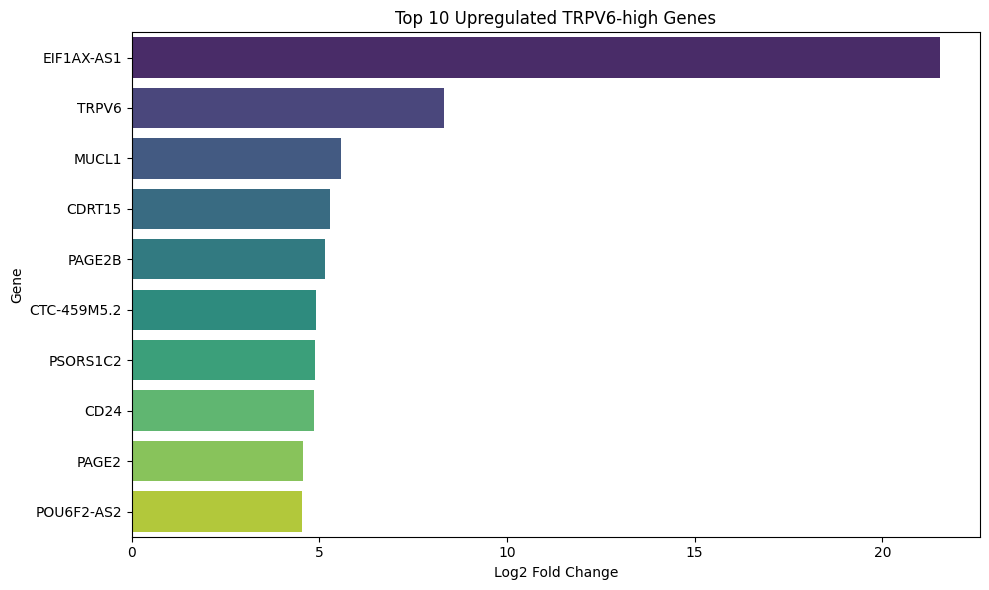

In [ ]:
# =========================================================
# Step 27 — Drug Target Analysis (TRPV6-high, safe version)
# =========================================================

import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# Paths from previous steps
step25_file = "/mnt/data/trpv_results_step25/TRPV6_DEGs.csv"
step26_file = "/mnt/data/trpv_results_step26/TRPV6_high_GO_KEGG.csv"
output_dir = "/mnt/data/trpv_results_step27"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Load TRPV6 DEGs
degs = pd.read_csv(step25_file)
up_genes = degs.loc[degs['logfoldchanges'] > 0, 'names'].tolist()
print(f"Number of upregulated TRPV6 DEGs: {len(up_genes)}")

# -----------------------------
# Load Step26 GO/KEGG enrichment
go_kegg = pd.read_csv(step26_file)

# -----------------------------
# Filter pathways of interest
pathway_keywords = ['calcium', 'proliferation', 'immune']
relevant_pathways = go_kegg[go_kegg['Term'].str.lower().str.contains('|'.join(pathway_keywords))]
print(f"Number of relevant pathways: {len(relevant_pathways)}")

# -----------------------------
# Since 'native' column is missing, we use upregulated DEGs as candidate genes
genes_of_interest = up_genes
print(f"Number of candidate TRPV6-high genes for drug targeting: {len(genes_of_interest)}")

# Save candidate genes
genes_file = os.path.join(output_dir, "TRPV6_upregulated_pathway_genes.csv")
pd.DataFrame({'Gene': genes_of_interest}).to_csv(genes_file, index=False)
print(f"✅ Candidate genes saved: {genes_file}")

# -----------------------------
# Barplot — top 10 DEGs by log-fold change
top_genes = degs.loc[degs['names'].isin(genes_of_interest)].sort_values(
    'logfoldchanges', ascending=False
).head(10)

plt.figure(figsize=(10,6))
sns.barplot(x='logfoldchanges', y='names', data=top_genes, palette='viridis')
plt.xlabel('Log2 Fold Change')
plt.ylabel('Gene')
plt.title('Top 10 Upregulated TRPV6-high Genes')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "TRPV6_top10_genes.png"), dpi=300)
plt.show()


# Merge all samples
adata_all = adatas[0].concatenate(adatas[1:], batch_key='sample_id')

# Basic QC: compute total counts per cell & number of genes
adata_all.obs['n_counts'] = adata_all.X.sum(axis=1)
adata_all.obs['n_genes'] = (adata_all.X > 0).sum(axis=1)

# Plot QC metrics
plt.figure(figsize=(8,4))
sns.histplot(adata_all.obs['n_counts'], bins=50)
plt.title("Total counts per cell")
plt.show()

plt.figure(figsize=(8,4))
sns.histplot(adata_all.obs['n_genes'], bins=50)
plt.title("Number of genes per cell")
plt.show()

# Filter cells (optional)
sc.pp.filter_cells(adata_all, min_genes=200)
sc.pp.filter_genes(adata_all, min_cells=3)
